# <CENTER> **PROJECT: Classification of oil and gas fields**

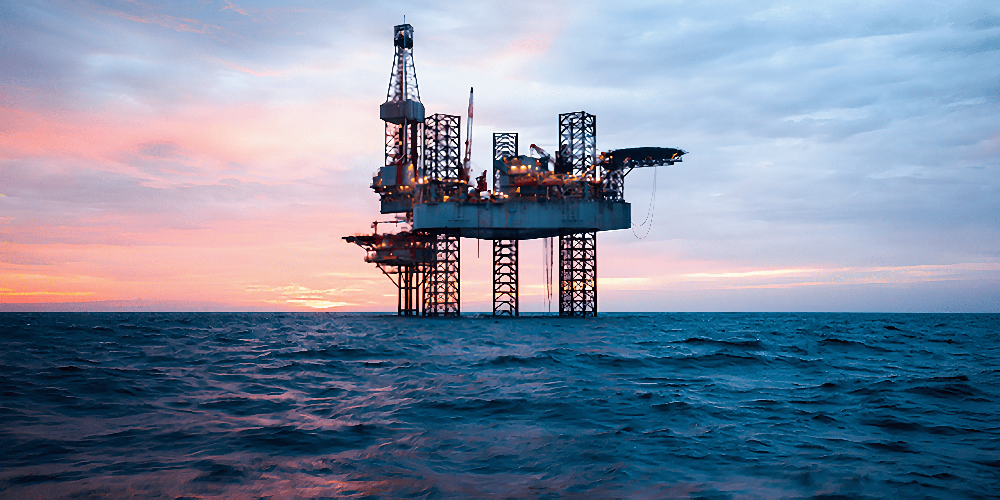

---

#### **Описание:**

Нефтегазовая отрасль имеет сложную технологическую цепочку, которая начинается с геологической разведки и заканчивается доставкой нефти и газа потребителям. Одной из важных задач является определение места залежей — на суше или в море — на основе различных параметров.

---


#### **Постановка задачи:**

Разработать алгоритм машинного обучения, который позволит классифицировать место залежей нефти и газа.

---


#### **Основные цели:**

* Сформировать набор данных на основе предоставленных источников информации;

* Спроектировать новые признаки с помощью *Feature Engineering* и выявить наиболее значимые при построении модели;

* Исследовать предоставленные данные и выявить закономерности;

* Построить несколько моделей и выбрать из них ту, которая показывает наилучший результат по заданной метрике.

---


#### **Этапы работы над проектом:**

Проект будет состоять из семи частей:

`1.` *Базовый анализ и знакомство с данными*;

`2.` *Очистка данных*;

`3.` *Разведывательный анализ данных*;

`4.` *Feature engineering (Создание новых признаков)*;

`5.` *Отбор признаков*;

`6.` *Machine Learning*;

`7.` *Вывод*.

---

**Импортируем необходимые библиотеки:**

In [ ]:
# Для работы с данными
import numpy as np
import pandas as pd
import category_encoders as ce
from imblearn import over_sampling


# Для построения графиков
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
plt.savefig('plot.png', dpi = 150)


# Для построения моделей
from sklearn import feature_selection
from sklearn import preprocessing
from sklearn import metrics
from sklearn import linear_model
from sklearn import ensemble
from sklearn import model_selection
from sklearn import tree
from sklearn import neighbors


# Для сохранения модели
import joblib

**Загрузка данных:**

In [132]:
# Загружаем тренеровочную и тестовую выборки
train_data = pd.read_csv('data/train_oil.csv')
test_data = pd.read_csv('data/oil_test.csv')


# Выводим размерности
print(f'Размер тренеровочной выборки: {train_data.shape}')
print(f'Размер тестовой выборки: {test_data.shape}')

Размер тренеровочной выборки: (309, 20)
Размер тестовой выборки: (133, 19)


Объединим оба датасета в один для выполнения различных преобразований:

In [133]:
# Создаём копию тестового файла
X_test = test_data.copy()


# Создаём общий для обеих выборок признак 'is_train', 
# чтобы в дальнейшем данные легче было обратно разделить
train_data['is_train'] = 1
test_data['is_train'] = 0


# Объединяем данные
combined_data = pd.concat(
    [train_data, test_data],
    axis = 0,
    ignore_index = True
)

# Создаём копию
combined_df = combined_data.copy()

## <CENTER> **`1.` Базовый анализ и знакомство с данными**

На данном этапе изучим информацию предоставленных данных.

#### $1.1$

Выведем информацию по таблице:

In [134]:
# Выводим размеры таблицы
print('Данные имеют следующую размерность:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(combined_df.shape[0], combined_df.shape[1]))


# Выведем первые пять строк 
display(combined_df.head())

Данные имеют следующую размерность:

Количество строк: 442;
Количество признаков (столбцов): 21.


,Field name,Reservoir unit,Country,Region,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,...,Reservoir status,Structural setting,Depth,Reservoir period,Lithology,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability,is_train
0,ZHIRNOV,MELEKESKIAN,RUSSIA,FORMER SOVIET UNION,VOLGA-URAL,COMPRESSION/EVAPORITE,51.0000,44.8042,NIZHNEVOLZHSKNET,ONSHORE,...,DECLINING PRODUCTION,FORELAND,1870,CARBONIFEROUS,SANDSTONE,262.0,33.0,24.0,30.0,1
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,LATIN AMERICA,ESPIRITO SANTO,EXTENSION,-19.6017,-39.8332,PETROBRAS,ONSHORE,...,NEARLY DEPLETED,PASSIVE MARGIN,4843,PALEOGENE,SANDSTONE,2133.0,72.0,23.0,350.0,1
2,ABQAIQ,ARAB D,SAUDI ARABIA,MIDDLE EAST,THE GULF,COMPRESSION/EVAPORITE,26.0800,49.8100,SAUDI ARAMCO,ONSHORE,...,REJUVENATING,FORELAND,6050,JURASSIC,LIMESTONE,250.0,184.0,21.0,410.0,1
3,MURCHISON,BRENT,UK /NORWAY,EUROPE,NORTH SEA NORTHERN,EXTENSION,61.3833,1.7500,CNR,OFFSHORE,...,NEARLY DEPLETED,RIFT,8988,JURASSIC,SANDSTONE,425.0,300.0,22.0,750.0,1
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,NORTH AMERICA,WESTERN CANADA,COMPRESSION,53.2287,-115.8008,NUMEROUS,ONSHORE,...,UNKNOWN,FORELAND,9306,DEVONIAN,DOLOMITE,233.0,167.0,11.8,1407.0,1


#### **Основные характеристики:**

Каждое месторождение обладает 19 параметрами:

* `Field name` - название месторождения;

* `Reservoir unit` - юнит месторождения;

* `Country` - страна расположения;

* `Region` - регион расположения;

* `Basin name` - название бассейна пород;

* `Tectonic regime` - тектонический режим;

* `Latitude` - широта;

* `Longitude` - долгота;

* `Operator company` - название компании;

* `Hydrocarbon type (main)` - тип углеводорода;

* `Reservoir status (current)` - статус месторождения;

* `Structural setting` - структурные свойства;

* `Depth (top reservoir ft TVD)` - глубина;

* `Reservoir period` - литологический период;

* `Lithology (main)` - литология;

* `Thickness (gross average ft)` - общая толщина;

* `Thickness (net pay average ft)` - эффективная толщина;

* `Porosity (matrix average 20. Permeability (air average mD))` – проницаемость;

**Целевой признак:**

* `Onshore or oﬀshore` - целевая переменная (*ONSHORE* - 1, *OFFSHORE* - 0, *ONSHORE-OFFSHORE* - 2).

---

#### $1.2$

Выведем информацию по признакам:

In [135]:
# Вывод таблицы
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 442 entries, 0 to 441
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Field name                      442 non-null    object 
 1   Reservoir unit                  442 non-null    object 
 2   Country                         402 non-null    object 
 3   Region                          388 non-null    object 
 4   Basin name                      396 non-null    object 
 5   Tectonic regime                 442 non-null    object 
 6   Latitude                        402 non-null    float64
 7   Longitude                       396 non-null    float64
 8   Operator company                442 non-null    object 
 9   Onshore/Offshore                309 non-null    object 
 10  Hydrocarbon type                442 non-null    object 
 11  Reservoir status                442 non-null    object 
 12  Structural setting              442 

Подсчитаем количество по типам признаков:

In [136]:
# Подсчет количества признаков типа 'object', 'int64' и 'float64'      
object_columns_count = combined_df.select_dtypes(include = ['object']).shape[1]
int64_columns_count = combined_df.select_dtypes(include = ['int64']).shape[1]
float64_columns_count = combined_df.select_dtypes(include = ['float64']).shape[1]


# Вывод результата
print('В данных представлены признаки следующих типов:\n')
print(f"Количество признаков типа 'object': {object_columns_count}")
print(f"Количество признаков типа 'int64': {int64_columns_count}")
print(f"Количество признаков типа 'float64': {float64_columns_count}")

В данных представлены признаки следующих типов:

Количество признаков типа 'object': 13
Количество признаков типа 'int64': 2
Количество признаков типа 'float64': 6


#### $1.3$

Выведем описательные характеристики по признакам:

In [137]:
# Вывод таблицы
combined_df.describe()

,Latitude,Longitude,Depth,Thickness (gross average ft),Thickness (net pay average ft),Porosity,Permeability,is_train
count,402.000000,396.000000,442.000000,442.000000,442.000000,442.000000,442.000000,442.000000
mean,35.546523,-9.374659,6613.658371,784.540724,189.061946,17.929955,469.916425,0.699095
std,21.740225,88.157751,3572.468358,1442.899648,282.161279,7.554253,1017.081304,0.459171
min,-38.398900,-151.615300,220.000000,11.000000,0.000000,1.100000,0.010000,0.000000
25%,28.352250,-102.436925,3824.500000,135.750000,43.000000,12.000000,10.000000,0.000000
50%,37.891700,2.069400,6137.500000,328.000000,100.000000,17.900000,79.500000,1.000000
75%,51.651200,57.666700,9071.500000,748.750000,206.500000,24.000000,400.000000,1.000000
max,76.446200,148.417000,19888.000000,12500.000000,2976.000000,55.000000,7500.000000,1.000000


## <CENTER> **`2.` Очистка данных**

На данном этапе выявим и очистим данные от пропусков, дубликатов и выбрасов.

#### $2.1$

**Проверим данные на наличие пропусков:**

Суммарное количество пропусков в данных: 359 

--------------------------------------------------
Информация по количествам пропусков: 

Field name                          0
Reservoir unit                      0
Country                            40
Region                             54
Basin name                         46
Tectonic regime                     0
Latitude                           40
Longitude                          46
Operator company                    0
Onshore/Offshore                  133
Hydrocarbon type                    0
Reservoir status                    0
Structural setting                  0
Depth                               0
Reservoir period                    0
Lithology                           0
Thickness (gross average ft)        0
Thickness (net pay average ft)      0
Porosity                            0
Permeability                        0
is_train                            0
dtype: int64 

--------------------------------------------------

<Axes: title={'center': 'Тепловая карта пропущенных значений'}>

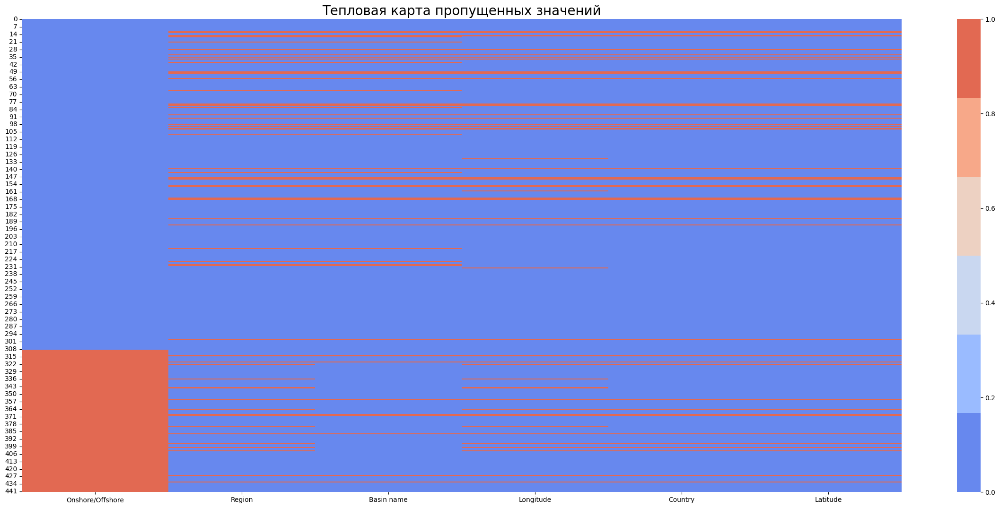

In [138]:
# Выводим суммарное количество пропусков
print('Суммарное количество пропусков в данных: {} \n'.format(combined_df.isnull().sum().sum()))
print('-' * 50)

# Выводим признаки с сумрным количеством пропусков
print('Информация по количествам пропусков: \n\n{} \n'.format(combined_df.isnull().sum()))
print('-' * 50)



# Построим тепловую карту пропусков
# Создаём функцию отображения пропущенных значений на тепловой карте
def missing_values_heatmap(data):
    
    # Рассчитываем количество пропусков
    cols_null_persent = data.isnull().mean() * 100
    cols_with_null = cols_null_persent[cols_null_persent > 0].sort_values(ascending = False)
    print(f'Информация по количествам пропусков в процентах:\n\n{cols_with_null}')
    print('-' * 50)
    
    # Задаём параметры графика
    colors = sns.color_palette('coolwarm')
    fig = plt.figure(figsize = (30, 13))
    cols = cols_with_null.index
    
    # Строим тепловую карту
    ax = sns.heatmap(
        data = data[cols].isnull(),
        cmap = sns.color_palette(colors)
    )
    
    # Задаём название графика
    plt.title('Тепловая карта пропущенных значений', fontsize = 20)
    
    return ax



# Применяем полученную функцию к нашему датасету
missing_values_heatmap(combined_df)

**Вывод:**

Из полученной информации видно, что пропуски имеют следующие признаки:

* *Onshore/Offshore*_____30 %
* *Region*_______________12 %
* *Basin name*___________10 %
* *Longitude*____________10 %
* *Country*_______________9 %
* *Latitude*______________9 %

Наличие пропусков в целевой переменной `Onshore/Offshore` объясняется тем, что данный признак отсутствует в тестовой выборке, следовательно, после объединения тренировочной и тестовой выборок в полученном датасете образовались пропуски в тестовой части таблицы. Поэтому, данный признак обрабатывать не будем.

Оставшиеся признаки обработаем следующим образом:

* Пропуски в `Region`, `Basin name` и `Country` заполним **модой**;

* Пропуски в `Longitude` и `Latitude` заполним **медианой**.

In [139]:
# Заполняем пропущенные значения медианой
columns_to_fill_median = [
    'Longitude',
    'Latitude'
]

combined_df[columns_to_fill_median] = combined_df[columns_to_fill_median].fillna(combined_df[columns_to_fill_median].median())
X_test[columns_to_fill_median] = X_test[columns_to_fill_median].fillna(X_test[columns_to_fill_median].median())



# Заполняем пропущенные значения модой
columns_to_fill_mode = [
    'Region',
    'Basin name',
    'Country'
]

for column in columns_to_fill_mode:
    combined_df[column] = combined_df[column].fillna(combined_df[column].mode()[0])
    X_test[column] = X_test[column].fillna(X_test[column].mode()[0])

Выведем количество пропусков:

In [140]:
# Выводим признаки с сумрным количеством пропусков
print('Информация по количествам пропусков: \n\n{} \n\n'.format(combined_df.isnull().sum()))


# Выводим размерность таблицы
print('Размерность таблицы после удаления пропусков: {}'.format(combined_df.shape))

Информация по количествам пропусков: 

Field name                          0
Reservoir unit                      0
Country                             0
Region                              0
Basin name                          0
Tectonic regime                     0
Latitude                            0
Longitude                           0
Operator company                    0
Onshore/Offshore                  133
Hydrocarbon type                    0
Reservoir status                    0
Structural setting                  0
Depth                               0
Reservoir period                    0
Lithology                           0
Thickness (gross average ft)        0
Thickness (net pay average ft)      0
Porosity                            0
Permeability                        0
is_train                            0
dtype: int64 


Размерность таблицы после удаления пропусков: (442, 21)


#### $2.2$

**Проверяем данные на наличие дубликатов:**

In [141]:
# Создаём список признаков
dupl_columns = list(combined_df.columns)


# Создаём маску дубликатов с помощью метода duplicated() и произведём фильтрацию
mask = combined_df.duplicated(subset = dupl_columns)
train_duplicates = combined_df[mask]
print(f'Число найденных дубликатов: {train_duplicates.shape[0]}')

Число найденных дубликатов: 0


#### $2.3$

**Проверяем данные на наличие выбросов.**

Создадим список признаков с возможными выбросами:

In [142]:
# Создание списка признаков типа 'int64' и 'float64'
numeric_columns = combined_df.select_dtypes(include = ['int64', 'float64']).columns.tolist()

Создадим функцию для поиска выбросов:

In [143]:
# Функция для поиска выбросов через IQR
def detect_outliers_iqr(data, features):
    
    # Создаём словарь, ключами которого будут индексы признаков,
    # а значениями - их количество
    outliers_dict = {}
    
    
    # Пройдёмся циклом for по признакам
    for feature in features:
        
        Q1 = data[feature].quantile(0.25)         # первый квартиль
        Q3 = data[feature].quantile(0.75)         # третий квартиль
        IQR = Q3 - Q1                             # межквартильный размах
        
        # Границы (нижняя и верхняя) для определения выбросов
        lower_bound = Q1 - 1.5 * IQR    
        upper_bound = Q3 + 1.5 * IQR   
        
        # Поиск выбросов
        outliers_dict[feature] = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)][feature]  
        
    return outliers_dict

Организуем поиск выбросов:

In [144]:
# Создаём переменную, в котором будем хранить признаки с количеством выбросов
outliers = detect_outliers_iqr(
    data = combined_df,
    features = numeric_columns
)


# Вывод выбросов
for feature, values in outliers.items():
    print('"{}":   количество выбросов в признаке: {}'.format(feature, len(values)))
    print('-' * 70)
    print()

"Latitude":   количество выбросов в признаке: 29
----------------------------------------------------------------------

"Longitude":   количество выбросов в признаке: 0
----------------------------------------------------------------------

"Depth":   количество выбросов в признаке: 3
----------------------------------------------------------------------

"Thickness (gross average ft)":   количество выбросов в признаке: 43
----------------------------------------------------------------------

"Thickness (net pay average ft)":   количество выбросов в признаке: 40
----------------------------------------------------------------------

"Porosity":   количество выбросов в признаке: 1
----------------------------------------------------------------------

"Permeability":   количество выбросов в признаке: 71
----------------------------------------------------------------------

"is_train":   количество выбросов в признаке: 0
----------------------------------------------------------------

Создадим *DataFrame* для построения визуализации:

In [145]:
# Создаём список признаков, содержащих выбросы
# и список, содержащий количество выбросов
feature_names = []
outliers_count = []
outliers_values = []



# Создаём цикл for по факторам, содержащие выбросы
for feature, values in outliers.items():
    if len(values) > 0:
        feature_names.append(feature)
        outliers_count.append(len(values))
        outliers_values.append(values)
        
        
        
# Создаём DataFrame, который будет содержать 2 признака:
# - 1-й признак содержит названия столбцов,
# - 2-й признак - значения выбросов
data_dict = {}

for feature in feature_names:
    for count in outliers_values:
        data_dict[feature] = count
        
data = pd.DataFrame(data_dict)

Строим график:

------------------------------------------------------------------------------------------------------------------------------------------------------
"Boxplot" для выбранных признаков:


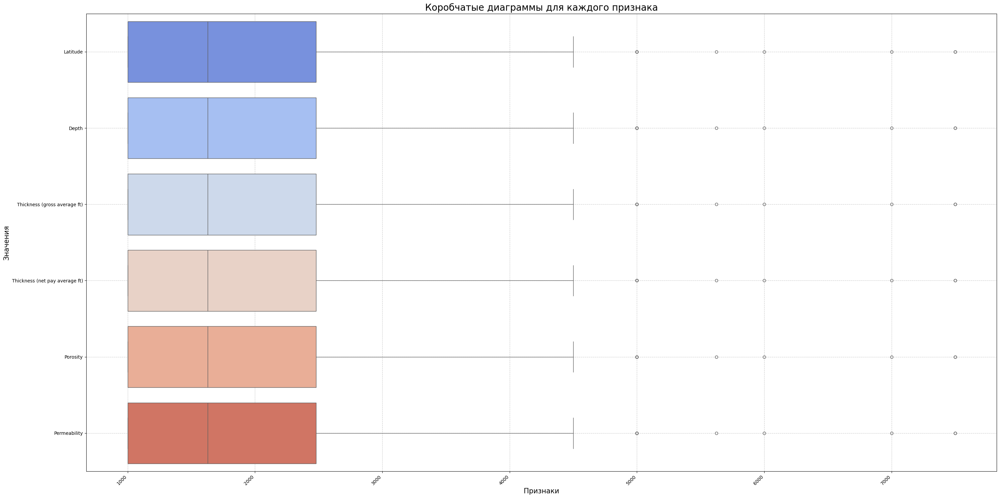

In [146]:
# Задаём заголовок гравика
print('-' * 150)
print('"Boxplot" для выбранных признаков:')


# Построение boxplot для всех числовых признаков
plt.figure(figsize = (30, 15))

sns.boxplot(
    data = data, 
    orient = 'h', 
    palette = 'coolwarm'
)

plt.xticks(rotation = 45, ha = 'right')
plt.title('Коробчатые диаграммы для каждого признака', fontsize = 20)
plt.ylabel('Значения', fontsize = 15)
plt.xlabel('Признаки', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.tight_layout()


# Показ графика
plt.show()

**Вывод:**

Выбросы были выявлены в следующих признаках:

* `Latitude`:________________________________________29;

* `Depth`:____________________________________________3;

* `Thickness (gross average ft)`:____________________43;

* `Thickness (net pay average ft)`:__________________40;

* `Porosity`:_________________________________________1;

* `Permeability`:____________________________________71.

Та как количество выбросов не большое, попробуем обойтись без предобработки.

## <CENTER> **`3.` Разведывательный анализ данных**

В данной части проекта мы:

* изучаем сгенерированный набор данных;

* дополним наш анализ визуализациями, иллюстрирующими исследование.

#### $3.1$

**Построим зависимости целевой переменной `Onshore/Offshore` от географических признаков.**

Посмотрим, как `Onshore/Offshore` распределён по регионам:

In [147]:
# Создаём сводную таблицу признака "Onshore/Offshore" по "Region"
pivot_onshore_region = pd.pivot_table(
    combined_df,
    values = 'Field name',
    index = 'Region',
    columns = 'Onshore/Offshore',
    aggfunc = 'count',
    fill_value = 0
)

# Выводим таблицу
print(f'Сводная таблица: Onshore/Offshore по регионам (Region):\n\n{pivot_onshore_region}')

Сводная таблица: Onshore/Offshore по регионам (Region):

Onshore/Offshore     OFFSHORE  ONSHORE  ONSHORE-OFFSHORE
Region                                                  
AFRICA                     11        8                 0
EUROPE                     33        4                 2
FAR EAST                   16       30                 0
FORMER SOVIET UNION         2       22                 1
LATIN AMERICA               2       10                 0
MIDDLE EAST                 7       13                 0
NORTH AMERICA              15      131                 2


Построим тепловую карту для визуализации распределения `Onshore/Offshore` по регионам:

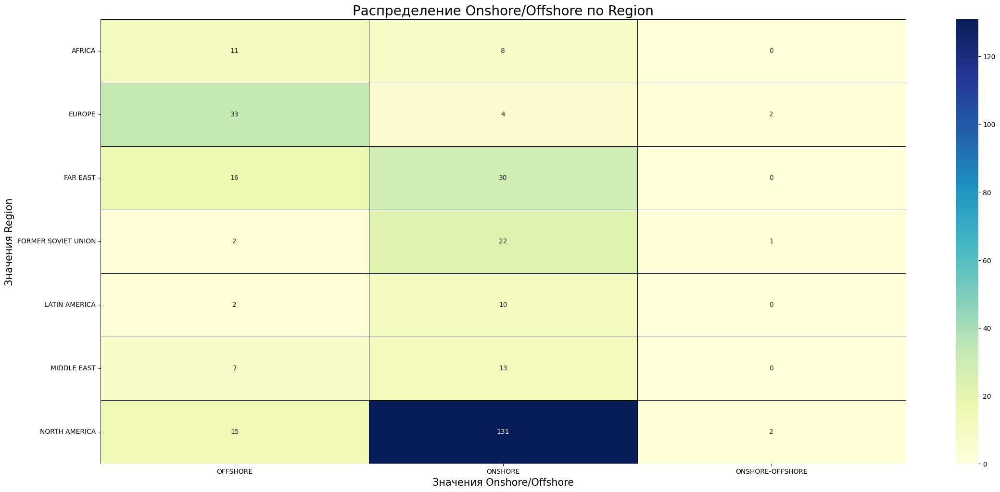

In [149]:
# Задаём размер heatmap
plt.rcParams['figure.figsize'] = (27, 12)


# Строим карту
sns.heatmap(
    pivot_onshore_region,
    annot = True,
    cmap = 'YlGnBu',
    fmt = 'd',
    linewidths = 0.5,
    linecolor = 'black'
)


# Задаём парметры карты
plt.title('Распределение Onshore/Offshore по Region', fontsize = 20)
plt.xlabel('Значения Onshore/Offshore', fontsize = 15)
plt.ylabel('Значения Region', fontsize = 15)

# Выводим график
plt.show()

Теперь посмотрим, как `Onshore/Offshore` распределён по странам:

In [150]:
# Создаём сводную таблицу признака "Onshore/Offshore" по "Country"
pivot_onshore_country = pd.pivot_table(
    combined_df,
    values = 'Field name',
    index = 'Country',
    columns = 'Onshore/Offshore',
    aggfunc = 'count',
    fill_value = 0
)

# Выводим таблицу
print(f'Сводная таблица: Onshore/Offshore по странам (Country):\n\n{pivot_onshore_country}')

Сводная таблица: Onshore/Offshore по странам (Country):

Onshore/Offshore     OFFSHORE  ONSHORE  ONSHORE-OFFSHORE
Country                                                 
AFGHANISTAN                 0        1                 0
ALGERIA                     0        1                 0
ANGOLA                      1        0                 0
AUSTRALIA                   6        2                 0
BRAZIL                      2        3                 0
CANADA                      4       29                 0
CHINA                       3       17                 0
COLOMBIA                    0        2                 0
DENMARK                     1        0                 0
EGYPT                       3        4                 0
EQUATORIAL GUINEA           1        0                 0
FRANCE                      0        4                 1
GABON                       1        0                 0
INDIA                       1        4                 0
INDONESIA                   4  

**Вывод:**

Данные показывают, что большинство регионов имеют преимущественно оншорные месторождения. Северная Америка выделяется как регион с наибольшим количеством залежей нефти, далее следует Канада и Великобритания.

#### $3.2$

**Построим зависимости целевой переменной `Onshore/Offshore` от геологических признаков.**

Посмотрим, как `Onshore/Offshore` связан с `Tectonic regime`:

In [151]:
# Создаём сводную таблицу признака "Onshore/Offshore" по "Tectonic regime"
pivot_onshore_tectonic = pd.pivot_table(
    combined_df,
    values = 'Field name',
    index = 'Tectonic regime',
    columns = 'Onshore/Offshore',
    aggfunc = 'count',
    fill_value = 0
)

# Выводим таблицу
print(f'Сводная таблица: Onshore/Offshore по Tectonic regime:\n\n{pivot_onshore_tectonic}')

Сводная таблица: Onshore/Offshore по Tectonic regime:

Onshore/Offshore                                    OFFSHORE  ONSHORE  \
Tectonic regime                                                         
COMPRESSION                                                0       72   
COMPRESSION/EROSION                                        0       27   
COMPRESSION/EROSION/EXTENSION                              0        1   
COMPRESSION/EROSION/EXTENSION/LINKED                       0        3   
COMPRESSION/EROSION/GRAVITY/EVAPORITE/EXTENSION            0        2   
COMPRESSION/EVAPORITE                                      1       21   
COMPRESSION/EVAPORITE/EXTENSION/LINKED                     2        4   
COMPRESSION/EVAPORITE/GRAVITY                              0        1   
COMPRESSION/EXTENSION                                      0        1   
COMPRESSION/EXTENSION/EROSION                              0        1   
COMPRESSION/EXTENSION/EROSION/EVAPORITE                    0        1

Построим столбчатую диаграмму для `Onshore/Offshore` по `Tectonic regime`:

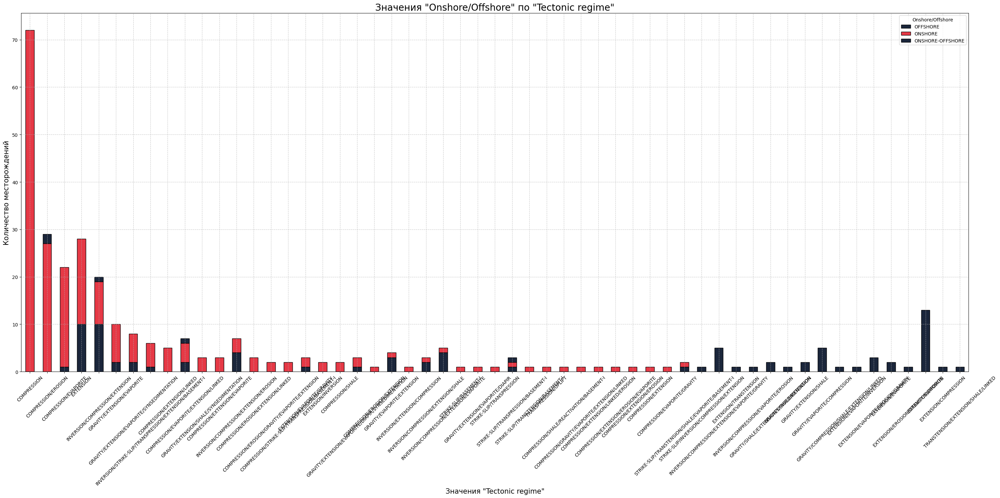

In [157]:
# Сортировка данных перед построением графика
pivot_onshore_tectonic_sorted = pivot_onshore_tectonic.sort_values(by = 'ONSHORE', ascending = False)



# Задаём размер диаграммы
plt.rcParams['figure.figsize'] = (30, 15)

# Строим график
pivot_onshore_tectonic_sorted.plot(
    kind = 'bar',
    stacked = True,
    color = ['#1B263B', '#E63946'],
    edgecolor = 'black'
)

# Задаём парметры карты
plt.title('Значения "Onshore/Offshore" по "Tectonic regime"', fontsize = 20)
plt.xlabel('Значения "Tectonic regime"', fontsize = 15)
plt.ylabel('Количество месторождений', fontsize = 15)
plt.legend(title = 'Onshore/Offshore')
plt.xticks(rotation = 45)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.tight_layout()

# Выводим график
plt.show()

**Вывод:**

Оншорные месторождения преобладают в большинстве тектонических режимов. Режимы **COMPRESSION** и **EXTENSION** занимают лидирующие позиции по количеству месторождений. Оффшорные и смешанные месторождения встречаются значительно реже и являются менее характерными для большинства тектонических режимов.

Теперь посмотрим на зависимость `Onshore/Offshore` от `Lithology`:

In [158]:
# Создаём сводную таблицу признака "Onshore/Offshore" по "Lithology"
pivot_onshore_lithology = pd.pivot_table(
    combined_df,
    values = 'Field name',
    index = 'Lithology',
    columns = 'Onshore/Offshore',
    aggfunc = 'count',
    fill_value = 0
)

# Выводим таблицу
print(f'Сводная таблица: "Onshore/Offshore" по "Lithology":\n\n{pivot_onshore_lithology}')

Сводная таблица: "Onshore/Offshore" по "Lithology":

Onshore/Offshore           OFFSHORE  ONSHORE  ONSHORE-OFFSHORE
Lithology                                                     
CHALK                             5        1                 0
CHALKY LIMESTONE                  2        3                 0
CONGLOMERATE                      1        5                 0
DOLOMITE                          1       43                 1
DOLOMITIC LIMESTONE               0        3                 0
LIMESTONE                        10       28                 0
LOW-RESISTIVITY SANDSTONE         1        5                 0
SANDSTONE                        63      118                 3
SHALE                             0        1                 0
SHALY SANDSTONE                   1        5                 0
SILTSTONE                         0        2                 0
THINLY-BEDDED SANDSTONE           2        3                 1
VOLCANICS                         0        1                 0


Построим столбчатую диаграмму для `Onshore/Offshore` по `Lithology`:

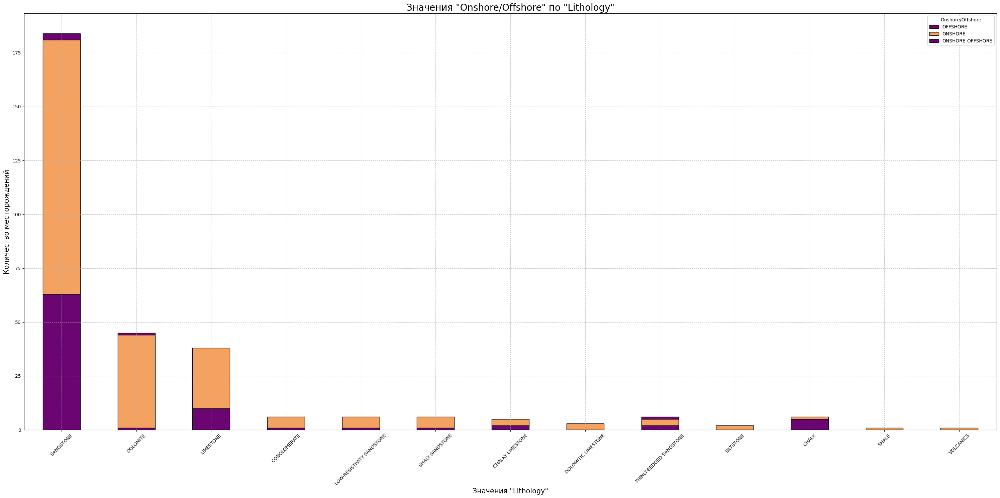

In [159]:
# Сортировка данных перед построением графика
pivot_onshore_lithology_sorted = pivot_onshore_lithology.sort_values(by = 'ONSHORE', ascending = False)


# Задаём размер диаграммы
plt.rcParams['figure.figsize'] = (30, 15)


# Строим график
pivot_onshore_lithology_sorted.plot(
    kind = 'bar',
    stacked = True,
    color = ['#6A0572', '#F4A261'],
    edgecolor = 'black'
)


# Задаём парметры карты
plt.title('Значения "Onshore/Offshore" по "Lithology"', fontsize = 20)
plt.xlabel('Значения "Lithology"', fontsize = 15)
plt.ylabel('Количество месторождений', fontsize = 15)
plt.legend(title = 'Onshore/Offshore')
plt.xticks(rotation = 45)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.tight_layout()

# Выводим график
plt.show()

**Вывод:**

Лидирующими литологиями по количеству месторождений являются **SANDSTONE**, **LIMESTONE**, и **DOLOMITE**. **SANDSTONE** является наиболее универсальной, встречаясь как в оншорных, так и в оффшорных категориях, причём смешанные месторождения редки.

#### $3.3$

**Построим зависимости целевой переменной `Onshore/Offshore` от физических характеристик.**

Посмотрим средние значения `Depth`, `Porosity` и `Permeability` для каждого значения `Onshore/Offshore`:

In [160]:
# Создаём сводную таблицу признака "Onshore/Offshore" по средним значениям физических характеристик
pivot_physical = pd.pivot_table(
    combined_df,
    values = ['Depth', 'Porosity', 'Permeability'],
    index = 'Onshore/Offshore',
    aggfunc = 'mean'
)

# Выводим таблицу
print(f'Сводная таблица: средние физические характеристики по "Onshore/Offshore":\n\n{pivot_physical}')

Сводная таблица: средние физические характеристики по "Onshore/Offshore":

                        Depth  Permeability   Porosity
Onshore/Offshore                                      
OFFSHORE          7688.395349    740.248256  20.856744
ONSHORE           6464.541284    376.101055  16.528899
ONSHORE-OFFSHORE  3406.000000    348.000000  22.200000


Построим ящики с усами (boxplot) для `Depth` и `Porosity` по `Onshore/Offshore`:

------------------------------------------------------------------------------------------------------------------------------------------------------
Boxplot для глубины ("Depth") по значениям "Onshore/Offshore"


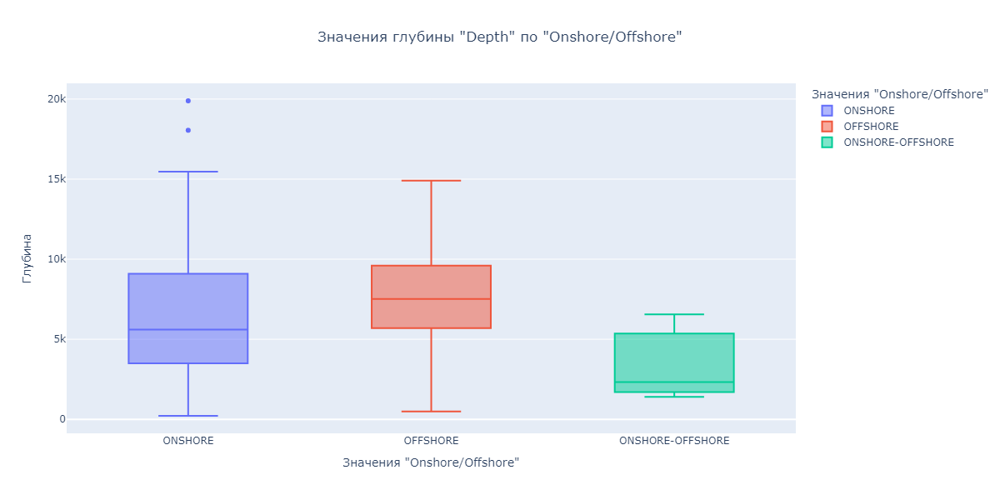

------------------------------------------------------------------------------------------------------------------------------------------------------
Boxplot для проницаемости ("Porosity") по значениям "Onshore/Offshore"


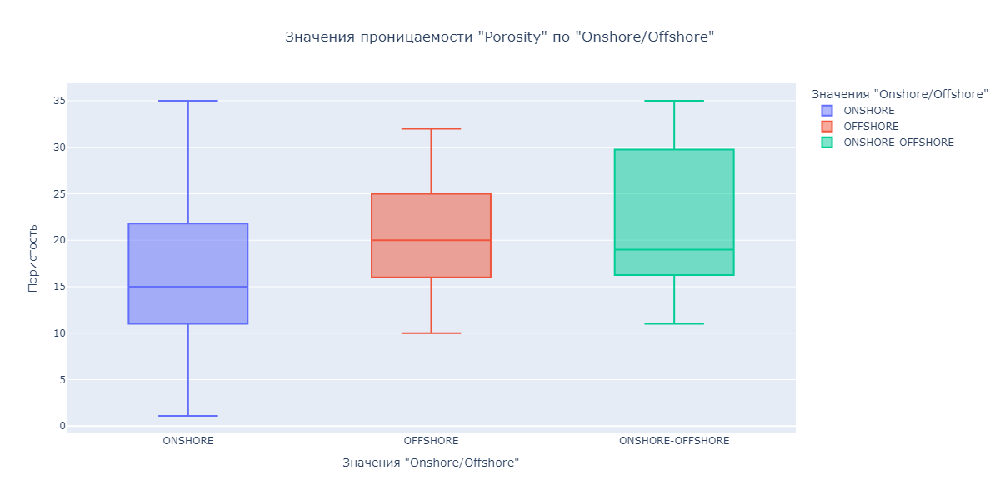

------------------------------------------------------------------------------------------------------------------------------------------------------


In [33]:
# Boxplot для "Depth" по значениям "Onshore/Offshore"
print('-' * 150)
print('Boxplot для глубины ("Depth") по значениям "Onshore/Offshore"')

fig = px.box(
    combined_df,
    x = 'Onshore/Offshore',
    y = 'Depth',
    color = 'Onshore/Offshore',
    title = 'Значения глубины "Depth" по "Onshore/Offshore"',
    labels = {'Onshore/Offshore': 'Значения "Onshore/Offshore"', 'Depth': 'Глубина'}
)

fig.update_layout(
    width = 1200,
    height = 600,
    title_x = 0.5,
    showlegend = True
)

fig.show('png')
print('-' * 150)




# Boxplot для "Porosity" по значениям "Onshore/Offshore"
print('Boxplot для проницаемости ("Porosity") по значениям "Onshore/Offshore"')

fig = px.box(
    combined_df,
    x = 'Onshore/Offshore',
    y = 'Porosity',
    color = 'Onshore/Offshore',
    title = 'Значения проницаемости "Porosity" по "Onshore/Offshore"',
    labels = {'Onshore/Offshore': 'Значения "Onshore/Offshore"', 'Porosity': 'Пористость'}
)

fig.update_layout(
    width = 1200,
    height = 600,
    title_x = 0.5,
    showlegend = True
)

fig.show('png')
print('-' * 150)

**Вывод:**

По полученным данным можно заключить следующее:

* **OFFSHORE** месторождения характеризуются наибольшей глубиной, высокой проницаемостью и значительной пористостью, что делает их ключевыми для добычи нефти.

* **ONSHORE** месторождения имеют меньшую глубину, проницаемость и пористость, но их разработка может быть более доступной из-за расположения.

* **ONSHORE-OFFSHORE** месторождения сочетают особенности обоих типов и выделяются максимальной пористостью, но имеют самую низкую проницаемость и глубину.

#### $3.4$

**Построим зависимость целевой переменной `Onshore/Offshore` от типа углеводорода `Hydrocarbon type`.**

Посмотрим распределение `Onshore/Offshore` по `Hydrocarbon type`:

In [161]:
# Создаём сводную таблицу признака "Onshore/Offshore" по типам углеводорода "Hydrocarbon type"
pivot_onshore_hydrocarbon = pd.pivot_table(
    combined_df,
    values = 'Field name',
    index = 'Hydrocarbon type',
    columns = 'Onshore/Offshore',
    aggfunc = 'count',
    fill_value = 0
)

# Выводим таблицу
print(f'Сводная таблица: "Onshore/Offshore" по "Hydrocarbon type":\n\n{pivot_onshore_hydrocarbon}')

Сводная таблица: "Onshore/Offshore" по "Hydrocarbon type":

Onshore/Offshore  OFFSHORE  ONSHORE  ONSHORE-OFFSHORE
Hydrocarbon type                                     
CARBON DIOXIDE           1        1                 0
GAS                     11       35                 0
GAS-CONDENSATE          13       17                 0
OIL                     61      165                 5


Построим столбчатую диаграмму:

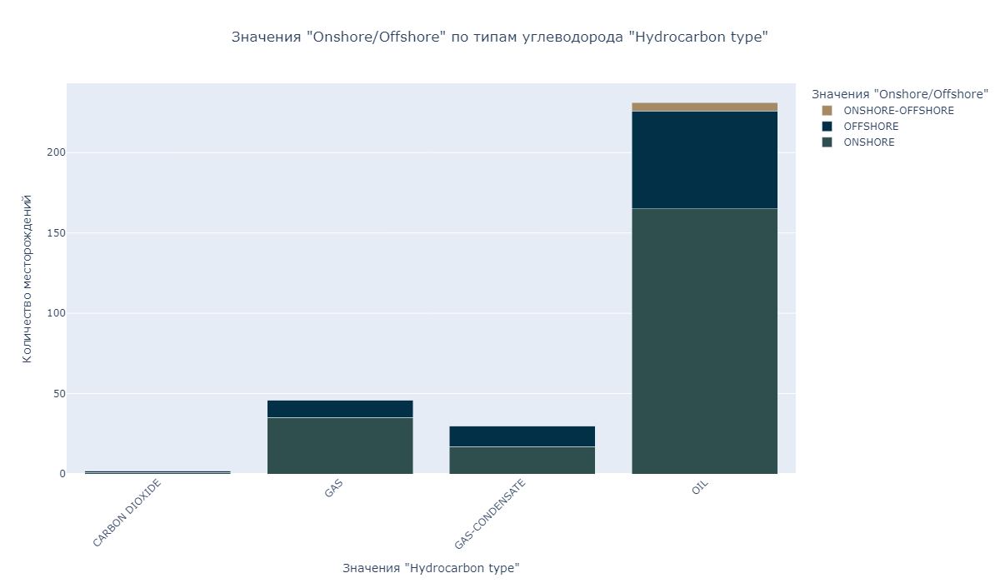

In [279]:
# Создаём данные для графика
categories = pivot_onshore_hydrocarbon.index
onshore = pivot_onshore_hydrocarbon.get('ONSHORE', pd.Series(0, index = categories))
offshore = pivot_onshore_hydrocarbon.get('OFFSHORE', pd.Series(0, index = categories))
onshore_offshore = pivot_onshore_hydrocarbon.get('ONSHORE-OFFSHORE', pd.Series(0, index = categories))



# Создаём столбчатую диаграмму
fig = go.Figure()

fig.add_trace(go.Bar(
    x = categories,
    y = onshore,
    name = 'ONSHORE',
    marker_color = '#2F4F4F'
))

fig.add_trace(go.Bar(
    x = categories,
    y = offshore,
    name = 'OFFSHORE',
    marker_color = '#023047'
))

fig.add_trace(go.Bar(
    x = categories,
    y = onshore_offshore,
    name = 'ONSHORE-OFFSHORE',
    marker_color = '#A68A64'
))


# Настройка макета
fig.update_layout(
    barmode = 'stack', 
    title = 'Значения "Onshore/Offshore" по типам углеводорода "Hydrocarbon type"',
    xaxis_title = 'Значения "Hydrocarbon type"',
    yaxis_title = 'Количество месторождений',
    xaxis_tickangle = -45,
    width = 1200,
    height = 700,
    title_x = 0.5,
    legend_title = 'Значения "Onshore/Offshore"'
)

# Отображение графика
fig.show('png')

**Вывод:**

По полученным данным мы можем сделать следующий вывод: Нефть (**OIL**) доминирует как в оншорных, так и в оффшорных месторождениях, причём в оншорных её значительно больше. Газообразные углеводороды (**GAS** и **GAS-CONDENSATE**) чаще встречаются на суше, но также имеют значительное количество залежей в оффшорных месторождениях. Углекислый газ (**CARBON DIOXIDE**) является крайне редким типом углеводорода.

#### $3.5$

**Построим зависимость целевой переменной `Onshore/Offshore` от компании `Operator company`.**

Посмотрим распределение `Onshore/Offshore` по `Operator company`:

In [163]:
# Создаём сводную таблицу признака "Onshore/Offshore" по добывающим компаниям "Operator company"
pivot_onshore_operator = pd.pivot_table(
    combined_df,
    values = 'Field name',
    index = 'Operator company',
    columns = 'Onshore/Offshore',
    aggfunc = 'count',
    fill_value = 0
)

# Выводим таблицу
print(f'Сводная таблица: "Onshore/Offshore" по "Operator company":\n\n{pivot_onshore_operator}')

Сводная таблица: "Onshore/Offshore" по "Operator company":

Onshore/Offshore                             OFFSHORE  ONSHORE  \
Operator company                                                 
ADCO                                                0        2   
ADMA /ZADCO                                         3        0   
AFGHANGAS                                           0        1   
ALBERTA ENERGY COMPANY /WESTCOAST PETROLEUM         0        1   
AMERADA HESS                                        2        4   
...                                               ...      ...   
WHITING OIL and GAS                                 0        2   
WILDFIRE PARTNERS INC                               0        1   
WOODSIDE                                            1        0   
YAKUTGASPROM                                        0        1   
YUGANSKNEFTEGAS /SIBNEFT /SURGUTNEFTEGAS            0        1   

Onshore/Offshore                             ONSHORE-OFFSHORE  
Operator company 

Отобразим топ-10 компаний по количеству месторождений:

<Figure size 3000x1500 with 0 Axes>

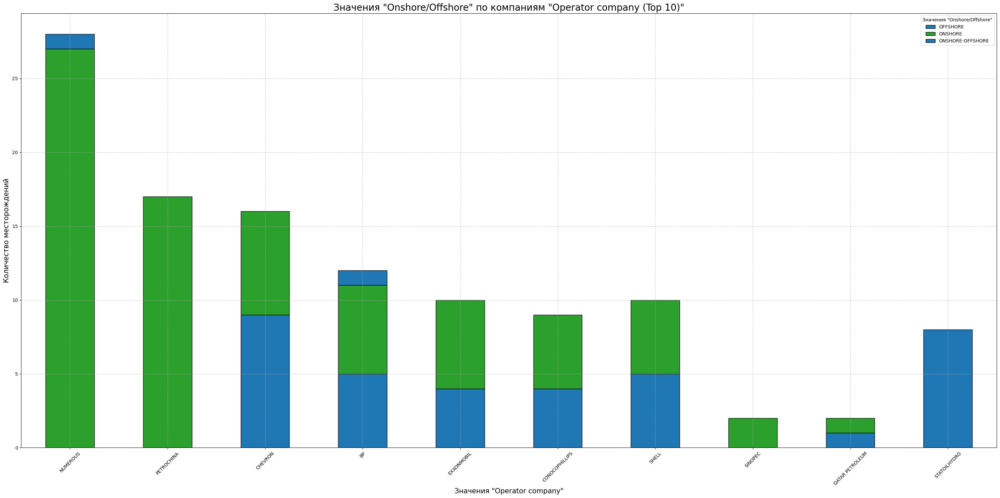

In [164]:
# Топ-10 компаний по количеству месторождений
top_operators = combined_df['Operator company'].value_counts().head(10).index
df_top_operators = combined_df[combined_df['Operator company'].isin(top_operators)]



# Сводная таблица для топ-10 компаний
pivot_onshore_operator_top = pd.pivot_table(
    df_top_operators,
    values = 'Field name',
    index = 'Operator company',
    columns = 'Onshore/Offshore',
    aggfunc = 'count',
    fill_value = 0
)



# Сортировка данных перед построением графика
pivot_onshore_operator_top_sorted = pivot_onshore_operator_top.sort_values(by = 'ONSHORE', ascending = False)

# Задаём размер диаграммы
plt.figure(figsize = (30, 15))

# Строим график
pivot_onshore_operator_top_sorted.plot(
    kind = 'bar', 
    stacked = True,
    color = ['#1F77B4', '#2CA02C'],
    edgecolor = 'black'
)

# Задаём парметры карты
plt.title('Значения "Onshore/Offshore" по компаниям "Operator company (Top 10)"', fontsize = 20)
plt.xlabel('Значения "Operator company"', fontsize = 15)
plt.ylabel('Количество месторождений', fontsize = 15)
plt.legend(title = 'Значения "Onshore/Offshore"')
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

**Вывод:**

По полученным данным можем заключить следующее: Деятельность большинства компаний сосредоточена либо на суше (**ONSHORE**), либо на шельфе (**OFFSHORE**), без значительного перекрытия между категориями. Исключения, такие как **AMERADA HESS**, демонстрируют, что лишь немногие компании успешно работают как в оншорных, так и в оффшорных условиях.

#### $3.6$

**Посмотрим на географическое распределение `Onshore/Offshore`.**

Построим точечный график (scatter plot) с использованием `Latitude` и `Longitude`, где цвет точек будет зависеть от `Onshore/Offshore`:

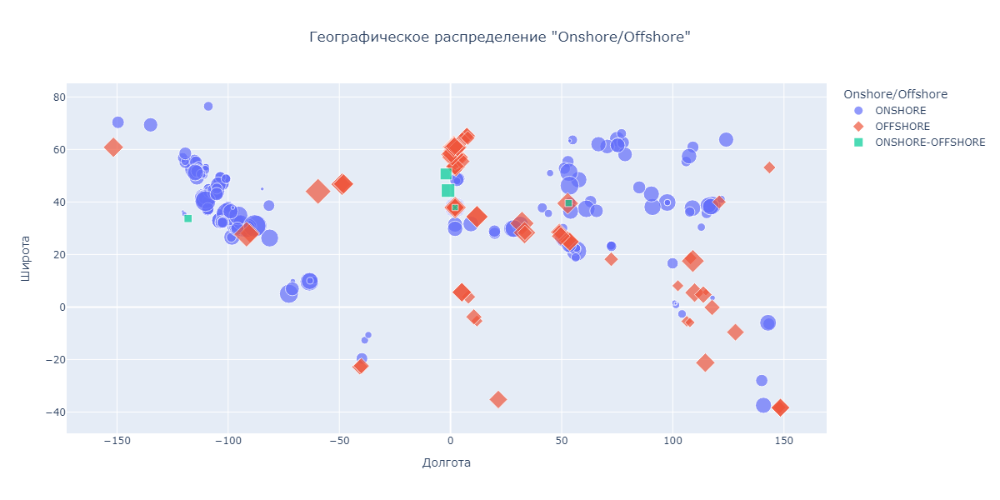

In [282]:
# Строим точечный график
fig = px.scatter(
    combined_df,
    x = 'Longitude',
    y = 'Latitude',
    color = 'Onshore/Offshore',  
    symbol = 'Onshore/Offshore',  
    size = 'Depth',  
    hover_data = ['Field name', 'Hydrocarbon type'], 
    title = 'Географическое распределение "Onshore/Offshore"',
    labels = {'Longitude': 'Долгота', 'Latitude': 'Широта'}
)



# Настройка макета
fig.update_layout(
    width = 1200,
    height = 600,
    title_x = 0.5,  
    showlegend = True
)

# Отображение графика
fig.show('png')

**Вывод:**

Полученный график демонстрирует значительное количество оншорных месторождений, умеренное количество оффшорных и небольшое число переходных месторождений. Основная активность сосредоточена в Северном полушарии.

## <CENTER> **`4.` Feature engineering (Создание новых признаков)**

На данном этапе преобразуем некоторые из признаков.

Выведем все категориальные признаки и количество уникальных значений:

In [21]:
# С помощью цикла for пройдёмся по столбцам датасета
# и выведем признаки типа 'object' и количество их уникальных значений
for column in combined_df.columns:
    if combined_df[column].dtype == object:
        print('"{}":   количество уникальных значений: {}'.format(column, combined_df[column].nunique()))
        print('-' * 70)
        print()

"Field name":   количество уникальных значений: 388
----------------------------------------------------------------------

"Reservoir unit":   количество уникальных значений: 353
----------------------------------------------------------------------

"Country":   количество уникальных значений: 48
----------------------------------------------------------------------

"Region":   количество уникальных значений: 7
----------------------------------------------------------------------

"Basin name":   количество уникальных значений: 108
----------------------------------------------------------------------

"Tectonic regime":   количество уникальных значений: 61
----------------------------------------------------------------------

"Operator company":   количество уникальных значений: 180
----------------------------------------------------------------------

"Onshore/Offshore":   количество уникальных значений: 3
----------------------------------------------------------------------



**Вывод:**

Из полученной информации видно, что большинство признаков имеют очень большое количество уникальных значений (> 15), поэтому порядок обработки будит следующий:

* Целевую переменную `Onshore/Offshore` закадируем с помощью **LabelEncoder**,

* Признаки с количество уникальных значений меньше 15 закадируем с помощью **OneHotEncoder**,

* Признаки с количество уникальных значений больше 15 закадируем с помощью **BinaryEncoder**.

Сперва разделим данные обратно на обучающую и тестовую выборки:

In [22]:
# Создаём список признаков для удаления
features_to_drop_list = ['is_train', 'Onshore/Offshore']


# Обратно выделяем выборку 'train_data' и 'test_data' 
train_data = combined_df[combined_df['is_train'] == 1].drop(columns = 'is_train').reset_index(drop = True)
test_data = combined_df[combined_df['is_train'] == 0].drop(columns = features_to_drop_list).reset_index(drop = True)


# Выводим размеры получившихся выборок
print(f'Размер тренировочной выборки: {train_data.shape}')
print(f'Размер тестовой выборки: {X_test.shape}')
print(f'Индексы в train_data:\n\n{train_data.index}')
print('\n\n')
print(f'Индексы в X_test:\n\n{X_test.index}')

Размер тренировочной выборки: (309, 20)
Размер тестовой выборки: (133, 19)
Индексы в train_data:

RangeIndex(start=0, stop=309, step=1)



Индексы в X_test:

RangeIndex(start=0, stop=133, step=1)


#### $4.1$

**Обрабатываем признак "Onshore/Offshore":**

In [23]:
# Создаём экземпляр класса LabelEncoder()
label_encoder = preprocessing.LabelEncoder()

# Обрабатываем переменную
train_data['Onshore/Offshore'] = label_encoder.fit_transform(train_data['Onshore/Offshore'])

# Сохраняем маппинг классов
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print(f'Сопоставление категорий и кодов: {label_mapping}')

Сопоставление категорий и кодов: {'OFFSHORE': 0, 'ONSHORE': 1, 'ONSHORE-OFFSHORE': 2}


#### $4.2$

**Обрабатываем признаки с помощью "OneHotEncoder()".**

Создадим функцию для обработки **DataFrame** при помощи алгоритма **OneHotEncoder**:

In [24]:
# Глобально инициализируем OneHotEncoder
OH_encoder = preprocessing.OneHotEncoder(sparse_output = False, handle_unknown = 'ignore')

# Обучаем OneHotEncoder на train_data 
columns_to_change = [column for column in train_data.columns if train_data[column].dtype == object and train_data[column].nunique() < 15]
OH_encoder.fit(train_data[columns_to_change])




# Создаём функцию для обработки признаков типа 'object' при помощи алгоритма 'OHE'
def OHE_preprocessing(data):
    
    """
    Применяет OneHotEncoder к данным.
    OH_encoder уже обучен на train_data.
    columns_to_change так же определён заранее.
    
    """

    # Применяем OneHotEncoder (только transform)
    data_OneHot = pd.DataFrame(
        OH_encoder.transform(data[columns_to_change]),
        columns = OH_encoder.get_feature_names_out(columns_to_change),
        index = data.index
    )
    
    
    # Объединяем оба датафрейма
    data_new = pd.concat(
        [data.reset_index(drop = True).drop(columns_to_change, axis = 1), data_OneHot],
        axis = 1
    )
   
   
    # Выведем количество новых признаков
    print('Количество полученных признаков: {}'.format(data_OneHot.shape[1]))

    return data_new

Применяем полученную функцию к основной таблице:

In [25]:
# Применяем полученную функцию к 'train_data'
train_data = OHE_preprocessing(train_data)

# Выведем первые 5 строк
train_data.head()

Количество полученных признаков: 37


,Field name,Reservoir unit,Country,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,Structural setting,...,Lithology_DOLOMITE,Lithology_DOLOMITIC LIMESTONE,Lithology_LIMESTONE,Lithology_LOW-RESISTIVITY SANDSTONE,Lithology_SANDSTONE,Lithology_SHALE,Lithology_SHALY SANDSTONE,Lithology_SILTSTONE,Lithology_THINLY-BEDDED SANDSTONE,Lithology_VOLCANICS
0,ZHIRNOV,MELEKESKIAN,RUSSIA,VOLGA-URAL,COMPRESSION/EVAPORITE,51.0000,44.8042,NIZHNEVOLZHSKNET,1,FORELAND,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,ESPIRITO SANTO,EXTENSION,-19.6017,-39.8332,PETROBRAS,1,PASSIVE MARGIN,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,ABQAIQ,ARAB D,SAUDI ARABIA,THE GULF,COMPRESSION/EVAPORITE,26.0800,49.8100,SAUDI ARAMCO,1,FORELAND,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,MURCHISON,BRENT,UK /NORWAY,NORTH SEA NORTHERN,EXTENSION,61.3833,1.7500,CNR,0,RIFT,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,WESTERN CANADA,COMPRESSION,53.2287,-115.8008,NUMEROUS,1,FORELAND,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Применяем полученную функцию к тестовой выборке:

In [26]:
# Применяем полученную функцию к 'X_test' 
X_test = OHE_preprocessing(X_test)

Количество полученных признаков: 37


#### $4.3$

**Обрабатываем признаки с помощью "BinaryEncoder".**

Создадим функцию для обработки **DataFrame** при помощи алгоритма **BinaryEncoder**:

In [36]:
# Глобально инициализируем BinaryEncoder
binary_encoder = ce.BinaryEncoder()

# Определяем столбцы для BinaryEncoder на основе train_data 
binary_columns = [column for column in train_data.columns if train_data[column].dtype == object and train_data[column].nunique() >= 15]
print("Столбцы для BinaryEncoder:", binary_columns)

# Обучаем BinaryEncoder на train_data
binary_encoder.fit(train_data[binary_columns])




# Создаём функцию для обработки признаков типа 'object' при помощи алгоритма 'BE'
def BE_preprocessing(data):
    
    """
    Применяет BinaryEncoder к данным.
    binary_encoder уже обучен на train_data.
    binary_columns так же определён заранее.
    
    """
    
    # Применяем BinaryEncoder (только transform)
    data_binary = binary_encoder.transform(data[binary_columns])
    
    # Объединяем датасеты
    data_new = pd.concat([data, data_binary], axis = 1)

    # Выводим количество новых признаков
    print('Количество полученных признаков после BinaryEncoder: {}'.format(data_binary.shape[1]))

    return data_new

Столбцы для BinaryEncoder: ['Field name', 'Reservoir unit', 'Country', 'Basin name', 'Tectonic regime', 'Operator company', 'Structural setting', 'Reservoir period']


Применяем полученную функцию к основной таблице:

In [37]:
# Применяем полученную функцию к 'train_data'
train_data = BE_preprocessing(train_data)

# Выведем первые 5 строк
train_data.head()

Количество полученных признаков после BinaryEncoder: 56


,Field name,Reservoir unit,Country,Basin name,Tectonic regime,Latitude,Longitude,Operator company,Onshore/Offshore,Structural setting,...,Structural setting_1,Structural setting_2,Structural setting_3,Structural setting_4,Structural setting_5,Reservoir period_0,Reservoir period_1,Reservoir period_2,Reservoir period_3,Reservoir period_4
0,ZHIRNOV,MELEKESKIAN,RUSSIA,VOLGA-URAL,COMPRESSION/EVAPORITE,51.0000,44.8042,NIZHNEVOLZHSKNET,1,FORELAND,...,0,0,0,0,1,0,0,0,0,1
1,LAGOA PARDA,LAGOA PARDA (URUCUTUCA),BRAZIL,ESPIRITO SANTO,EXTENSION,-19.6017,-39.8332,PETROBRAS,1,PASSIVE MARGIN,...,0,0,0,1,0,0,0,0,1,0
2,ABQAIQ,ARAB D,SAUDI ARABIA,THE GULF,COMPRESSION/EVAPORITE,26.0800,49.8100,SAUDI ARAMCO,1,FORELAND,...,0,0,0,0,1,0,0,0,1,1
3,MURCHISON,BRENT,UK /NORWAY,NORTH SEA NORTHERN,EXTENSION,61.3833,1.7500,CNR,0,RIFT,...,0,0,0,1,1,0,0,0,1,1
4,WEST PEMBINA,NISKU (PEMBINA L POOL),CANADA,WESTERN CANADA,COMPRESSION,53.2287,-115.8008,NUMEROUS,1,FORELAND,...,0,0,0,0,1,0,0,1,0,0


Применяем полученную функцию к тестовой выборке:

In [38]:
# Применяем полученную функцию к 'X_test'
X_test = BE_preprocessing(X_test)

Количество полученных признаков после BinaryEncoder: 56


#### $4.4$

Выведем информацию по датафрейму:

In [39]:
# Выводим таблицу
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Columns: 109 entries, Field name to Reservoir period_4
dtypes: float64(43), int32(1), int64(57), object(8)
memory usage: 262.1+ KB


Итоговый **DataFrame** получился слишком большим, выведем признаки типа `object`:

In [40]:
# Выбор признаков типа 'object'
object_features = train_data.select_dtypes(include = ['object']).columns.tolist()
print(object_features)

['Field name', 'Reservoir unit', 'Country', 'Basin name', 'Tectonic regime', 'Operator company', 'Structural setting', 'Reservoir period']


Удалим признаки типа `object`:

In [41]:
# Создаём функцию для удалени признаков типа 'object'
def object_columns_del(data):
    
    # Создаём список признаков типа 'object' и удалим их из итогового датасета
    object_columns = [feature for feature in data.columns if data[feature].dtype == object]
    data.drop(object_columns, axis = 1, inplace = True)
    
    return data
    
    
    
    
# Применяем полученную функцию к основному DataFrame
train_data = object_columns_del(train_data)

# Выведем типипзацию признаков
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Columns: 101 entries, Latitude to Reservoir period_4
dtypes: float64(43), int32(1), int64(57)
memory usage: 242.7 KB


Удалим признаки типа `object` из тестовой выборки:

In [42]:
# Применяем полученную функцию к 'X_test'
X_test = object_columns_del(X_test)

## <CENTER> **`5.` Отбор признаков**

На данном этапе проведём корреляционный анализмежду признаками, по необходимости избавимся от мультиколлинеарности, проведём нормализацию и отберём только самые информативные признаки для дальнейшего исследования.

#### $5.1$

Для начала проведём корреляционный анализ. Построим тепловую карту корреляций признаков:

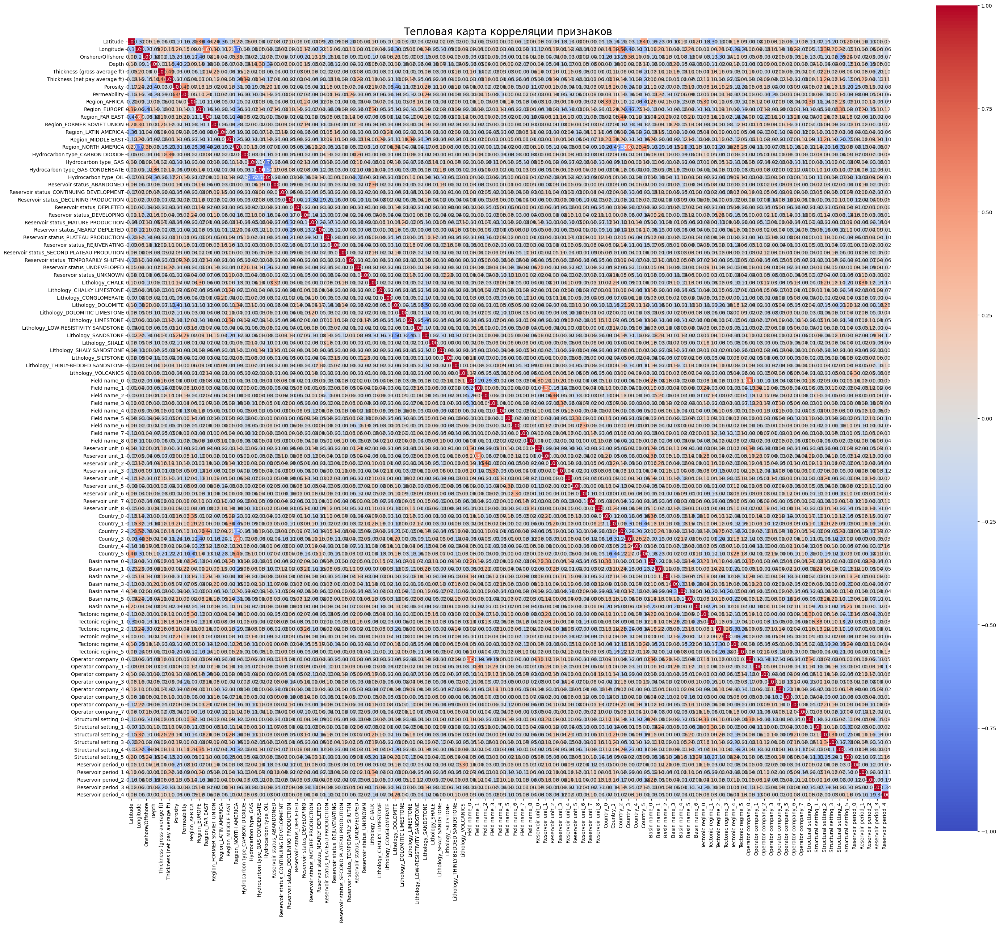

In [43]:
# Задаём параметры графика
plt.rcParams['figure.figsize'] = (30, 30)
correlation_matrix = train_data.corr()



# Строим тепловую карту
sns.heatmap(
    correlation_matrix, 
    annot = True,
    fmt = '.2f',
    cmap = 'coolwarm',
    vmin = -1, 
    vmax = 1, 
    center = 0,
    square = True,
    cbar_kws = {'shrink': .8},
    linewidths = 0.5
)

# Настраиваем параметры
plt.title('Тепловая карта корреляции признаков', fontsize = 20)
plt.tight_layout()

# Выводим график
plt.show()

**Вывод:**

Исходя из полученной карты видно, что предельные значения корреляции между признаками составляют $(+-)0.7$. Поэтому можно сказать, что высококоррелированные связи отсутствуют.

#### $5.2$

**Разделим данные на обучающую `X_train` и валидационную `X_valid` выборки, а также выделим целевую переменную `y`.**

Разделим данные на матрицу наблюдений и вектор правильных ответов:

In [44]:
# Матрица наблюдений X
X = train_data.drop(columns = 'Onshore/Offshore')

# Вектор правильных ответов
y = train_data['Onshore/Offshore']

Теперь разделим данные на обучающую и валидационную выборки:

In [45]:
# Разделяем train_data на тренировочную и валидационную выборки (70% на тренировку, 30% на валидацию)
X_train, X_valid, y_train, y_valid = model_selection.train_test_split(
    X, y,
    test_size = 0.3,
    random_state = 42,
    stratify = y
)


# Удаляем признаки с нулевой дисперсией
X_train = X_train.loc[:, X_train.var() > 0]
X_valid = X_valid[X_train.columns]
X_test = X_test[X_train.columns]


# Выведем итоговые размерности
print('Размер тренировочной выборки: {}'.format(X_train.shape))
print('Размер валидационной выборки: {}'.format(X_valid.shape))
print('Размер тестовой выборки: {}'.format(X_test.shape))

Размер тренировочной выборки: (216, 99)
Размер валидационной выборки: (93, 99)
Размер тестовой выборки: (133, 99)


#### $5.3$

Произведём нормализацию признаков при помощи алгоритма `MinMaxScaler()`, но для начала построим график распределения.

Создаём функцию для построения графика:

In [46]:
# Создаём функцию 'features_distribution_plot()' для построения графика распределения признаков
def features_distribution_plot(data, title = 'Распределение до нормализации', figsize = (30, 17)):
    
    
    """
    Функция для построения графиков распределения признаков.
    
    Параметры:
    - data: pandas DataFrame с данными.
    - features: список признаков для анализа.
    - title: заголовок графика.
    - figsize: размер графика.
    
    """
    
    
    # Задаём размер графика
    fig, ax = plt.subplots(figsize = figsize)

    # Построение плотностей распределения
    for column in data.columns:
    
        sns.kdeplot(
            data[column], 
            label = column, 
            ax = ax
        )



    # Настройка легенды: выносим за пределы графика
    plt.legend(
        bbox_to_anchor = (1.05, 1),
        loc = 'upper left',
        fontsize = 10
    )

    # Настройка графика
    plt.title(title, fontsize = 20)
    plt.xlabel('Значение', fontsize = 15)
    plt.ylabel('Плотность', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()  
    plt.show()

Строим график:

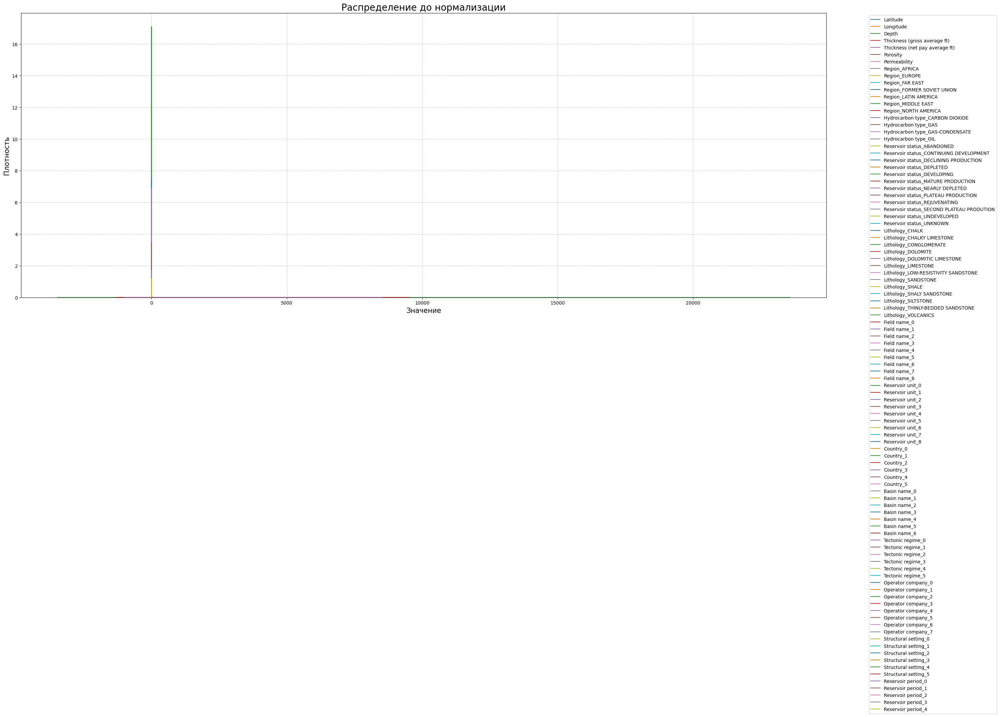

In [47]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков
features_distribution_plot(data = X_train)

Произведём преобразование:

In [48]:
# Глобально инициализируем MinMaxScaler
mm_scaler = preprocessing.MinMaxScaler()

# Обучаем MinMaxScaler на X_train
mm_scaler.fit(X_train)




# Создаём функцию для нормализации признаков 
def MMS_preprocessing(data):
    
    """
    Применяет MinMaxScaler к числовым признакам данных.
    mm_scaler уже обучен на X_train.
    numeric_columns так жеопределён заранее.
    
    """
    
    # Применяем MinMaxScaler (только transform)
    data_scaled = pd.DataFrame(
        mm_scaler.transform(data),
        columns  = data.columns,
        index = data.index
    )

    # Выводим количество числовых признаков
    print('Количество числовых признаков после "MinMaxScaler": {}'.format(data_scaled.shape[1]))

    return data_scaled

Применяем полученную функцию к таблицам `X_train`, `X_valid` и `X_test`:

In [49]:
# Нормализуем 'X_train', 'X_valid' и 'X_test'
X_train_processed = MMS_preprocessing(X_train)
X_valid_processed = MMS_preprocessing(X_valid)
X_test_processed = MMS_preprocessing(X_test)

Количество числовых признаков после "MinMaxScaler": 99
Количество числовых признаков после "MinMaxScaler": 99
Количество числовых признаков после "MinMaxScaler": 99


Выведем график после нормализации:

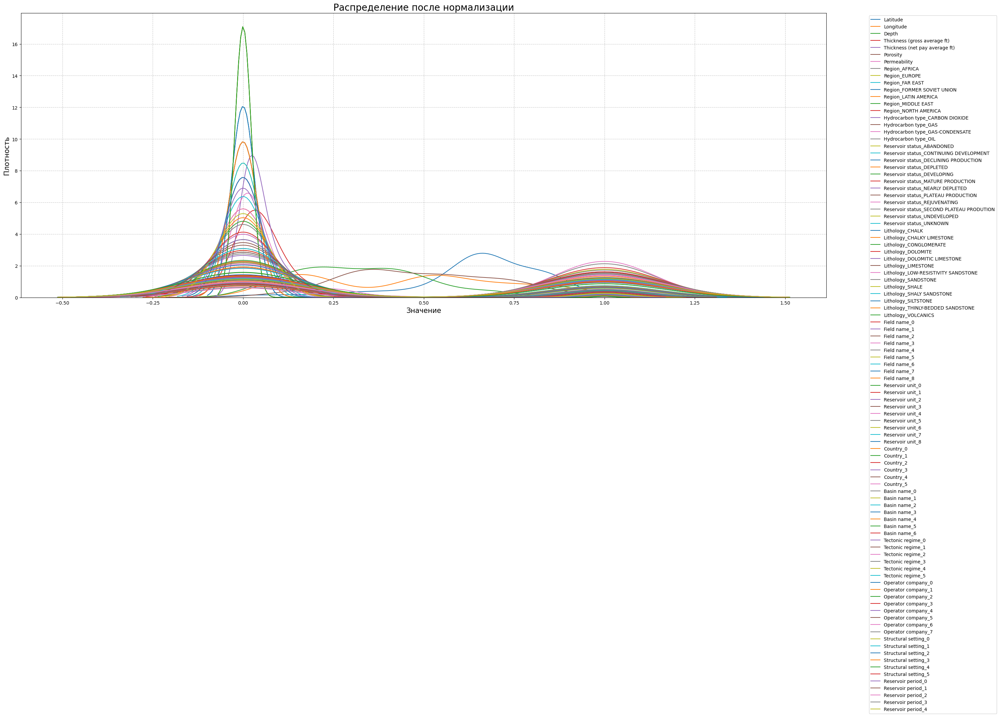

In [50]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков
features_distribution_plot(
    data = X_train_processed,
    title = 'Распределение после нормализации',
    figsize = (30, 17)
)

#### $5.4$

Используем алгоритм `SelectKBest` чтобы выделить 25 наиболее важных признаков для предсказания:

In [51]:
# Глобально инициализируем SelectKBest для выбора 25 признаков
selector = feature_selection.SelectKBest(
    score_func = feature_selection.f_classif,
    k = 25
)

# Обучаем SelectKBest на X_train_processed
selector.fit(X_train_processed, y_train)




# Создаём функцию для отбора 25 признаков
def SelectKBest_selection(data):
    
    """
    Применяет SelectKBest для выбора топ-25 признаков.
    selector уже обучен на X_train_processed и y_train.
    
    """
    
    # Применяем SelectKBest
    data_selected = pd.DataFrame(
        selector.transform(data),
        columns = data.columns[selector.get_support()],
        index = data.index
    )
    
    # Выводим количество выбранных признаков
    print('Количество выбранных признаков после "SelectKBest": {}'.format(data_selected.shape[1]))
    
    return data_selected

Применяем полученную функцию к таблицам `X_train`, `X_valid` и `X_test`:

In [52]:
# Производим отбор признаков для 'X_train', 'X_valid' и 'X_test'
X_train_processed = SelectKBest_selection(X_train_processed)
X_valid_processed = SelectKBest_selection(X_valid_processed)
X_test_processed = SelectKBest_selection(X_test_processed)

Количество выбранных признаков после "SelectKBest": 25
Количество выбранных признаков после "SelectKBest": 25
Количество выбранных признаков после "SelectKBest": 25


Построим визуализацию значимости признаков:

C:\Users\User\AppData\Local\Temp\ipykernel_13864\3895575242.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




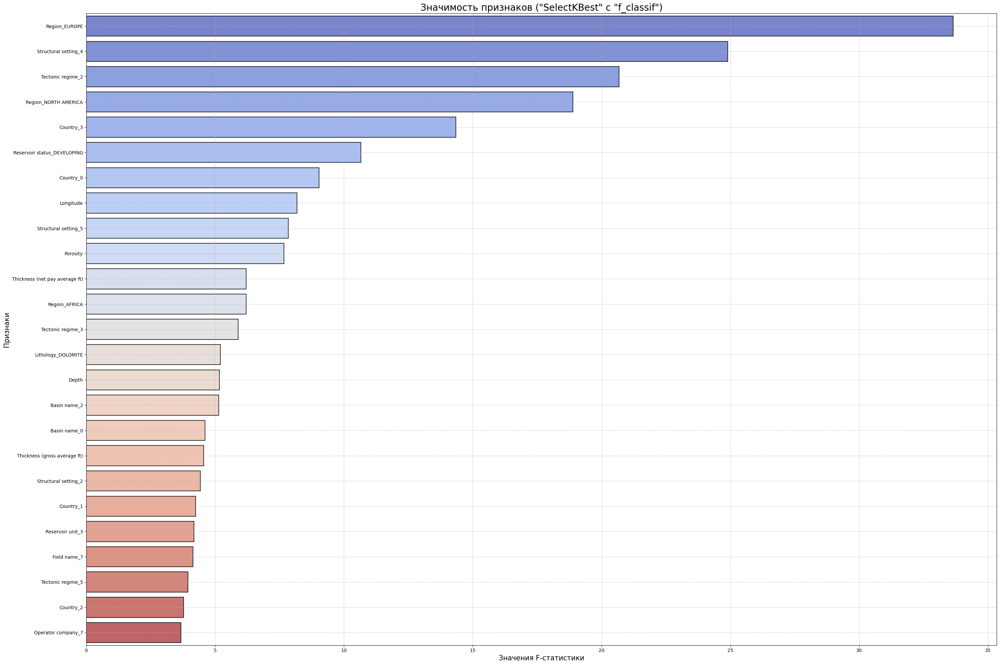

In [61]:
# Получаем scores_ для визуализации
scores = selector.scores_
feature_scores = pd.DataFrame({
    'Feature': X_train_processed.columns,
    'Score': scores[selector.get_support()]
})



# Визуализация: Бар-чарт значимости признаков
plt.figure(figsize = (30, 20))

sns.barplot(
    x = 'Score',
    y = 'Feature',
    
    # Используем отсортированные данные для построения графика
    data = feature_scores.sort_values(
        by = 'Score', 
        ascending = False
    ),
    
    palette = 'coolwarm',
    edgecolor = 'black',
    linewidth = 1.5,
    alpha = 0.8,
    orient = 'h'
)


# Настройка графика
plt.title('Значимость признаков ("SelectKBest" с "f_classif")', fontsize = 20)
plt.xlabel('Значения F-статистики', fontsize = 15)
plt.ylabel('Признаки', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.tight_layout()
plt.show()

Построим тепловую карту корреляции признаков:

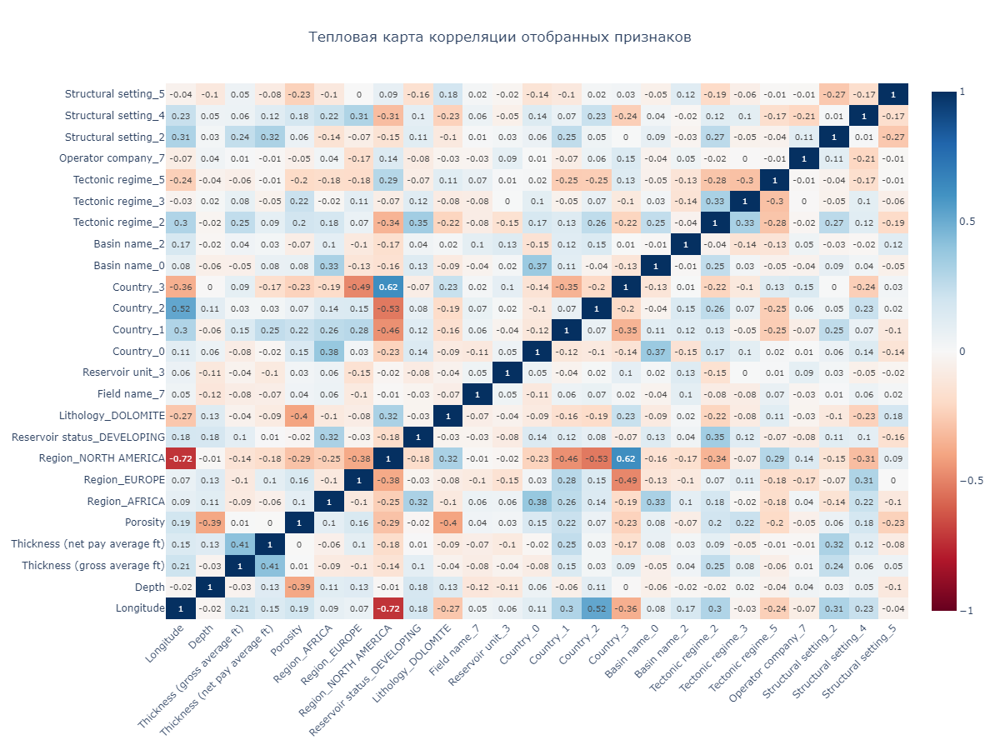

In [62]:
# Вычисляем корреляционную матрицу
correlation_matrix = X_train_processed.corr()


# Создаём тепловую карту
fig = go.Figure(data = go.Heatmap(
    z = correlation_matrix.values,
    x = correlation_matrix.columns,
    y = correlation_matrix.index,
    colorscale = 'RdBu',
    zmin = -1,
    zmax = 1,
    text = correlation_matrix.values.round(2),  
    texttemplate = "%{text}",  
    hoverinfo = 'z'
))

# Настройка макета
fig.update_layout(
    title = 'Тепловая карта корреляции отобранных признаков',
    width = 1200,
    height = 900,
    title_x = 0.5,
    xaxis_tickangle = -45
)

# Отображение графика
fig.show('png')

**Вывод:**

Из полученной тепловой карты видно, что высококоррелированные связи отсутствуют.

#### $5.5$

**Сбалансируем классы.**

Выведем размерности тренировочной выборки и целевой переменной:

In [63]:
# Выводим размеры тренировочной выборки
print('Данные имеют следующую размерность:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.\n'.format(X_train_processed.shape[0], X_train_processed.shape[1]))


# Выводим распределение целевой переменной
print(f'Распределение класса:\n{y_train.value_counts()}')

Данные имеют следующую размерность:

Количество строк: 216;
Количество признаков (столбцов): 25.

Распределение класса:
Onshore/Offshore
1    152
0     60
2      4
Name: count, dtype: int64


Создадим функцию для построения графика распределения целевого признака:

In [87]:
# Создаём функцию для построения графика распределения целевой переменной
def target_distribution_plot(target, title = 'Распределение целевой переменной', figsize = (30, 15)):
    
    
    """
    Функция для построения графика распределения целевой переменной.
    
    Параметры:
    - target: pandas Series с данными.
    - title: заголовок графика.
    - figsize: размер графика.
    
    """
    
    
    # Задаём размер графика
    fig, ax = plt.subplots(1, 2, figsize = figsize)
    
    # Гистограмма
    sns.countplot(
        x = target,
        ax = ax[0],
        palette = 'Set2',
        order = target.value_counts().index,
        edgecolor = 'black',
        linewidth = 1.5,
    )
     
    # Настройка графика
    ax[0].set_xticklabels(
        target.value_counts().index, 
        fontsize = 15
    )
    
    ax[0].set_title('Распределение признака Onshore/Offshore', fontsize = 20)
    ax[0].set_xlabel('Класс', fontsize = 15)
    ax[0].set_ylabel('Количество', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()



    # Кольцевая диаграмма
    target_counts = target.value_counts()

    wedges, texts, autotexts = ax[1].pie(
        target_counts,
        labels = target_counts.index,
        colors = sns.color_palette('Set2', 3),
        autopct = '%1.1f%%',
        startangle = 90
    )

    centre_circle = plt.Circle((0, 0), 0.70, fc = 'white')
    fig.gca().add_artist(centre_circle)
    ax[1].set_title('Распределение признака Onshore/Offshore', fontsize = 20)



    # Выводим график
    plt.show()

Построим график распределения целевого признака:

C:\Users\User\AppData\Local\Temp\ipykernel_13864\4137457391.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\User\AppData\Local\Temp\ipykernel_13864\4137457391.py:30: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



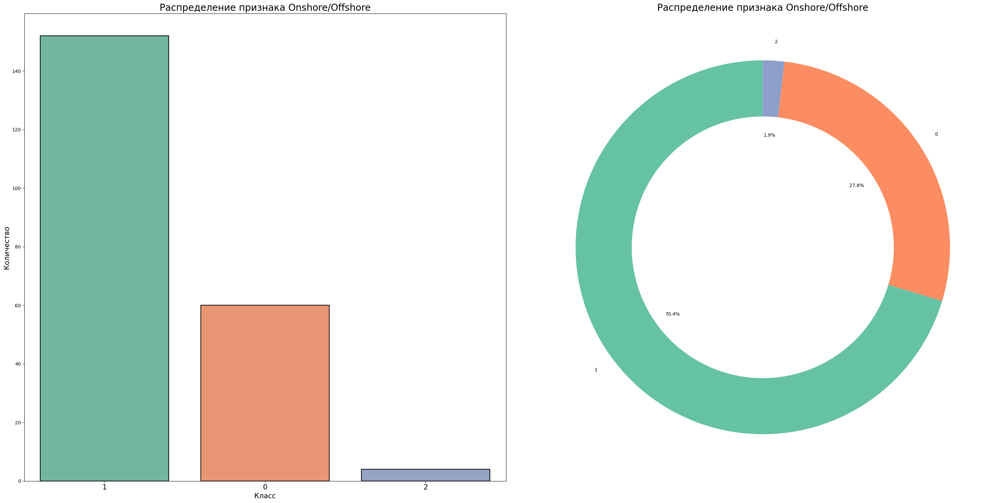

In [89]:
# Применяем функцию 'target_distribution_plot()' для построения графика распределения целевой переменной
target_distribution_plot(target = y_train)

Из построенной столбчатой диаграммы видно явный дисбаланс, особенно выделяется преобладание класса 1 над остальными. Так же следует отметить класс `2`, у которого всего 4 строки (1.9%), из-за чего практически не представлен в данных.

Для дальнейшей работы требуется балансировка классов.

Сбалансируем классы. Для этого воспользуемся алгоритмом `RandomOverSampler`, который отлично подходит для случаев с экстремально малым количеством данных в классе:

In [124]:
# Импорт и инициализация RandomOverSampler
os = over_sampling.RandomOverSampler(
    random_state = 0, 
    sampling_strategy = 'auto'
)

# Сохранение исходных названий столбцов
columns = X_train_processed.columns

# Применение RandomOverSampler для создания сбалансированных данных
X_train_os, y_train_os = os.fit_resample(X_train_processed, y_train)

# Создание DataFrame для сбалансированных данных
X_train_os = pd.DataFrame(X_train_os, columns = columns)
y_train_os = pd.DataFrame(y_train_os, columns = ['Onshore/Offshore'])

# Вывод информации о сбалансированных данных
print(f'Размерность данных после применения RandomOverSampler: {X_train_os.shape}')
print('-' * 65)
print()

print(f'Распределение классов после применения RandomOverSampler:\n\n{y_train_os.value_counts()}')
print('-' * 65)

Размерность данных после применения RandomOverSampler: (456, 25)
-----------------------------------------------------------------

Распределение классов после применения RandomOverSampler:

Onshore/Offshore
0                   152
1                   152
2                   152
Name: count, dtype: int64
-----------------------------------------------------------------


Построим график после устранения дисбаланса классов:

C:\Users\User\AppData\Local\Temp\ipykernel_13864\4137457391.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\User\AppData\Local\Temp\ipykernel_13864\4137457391.py:30: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



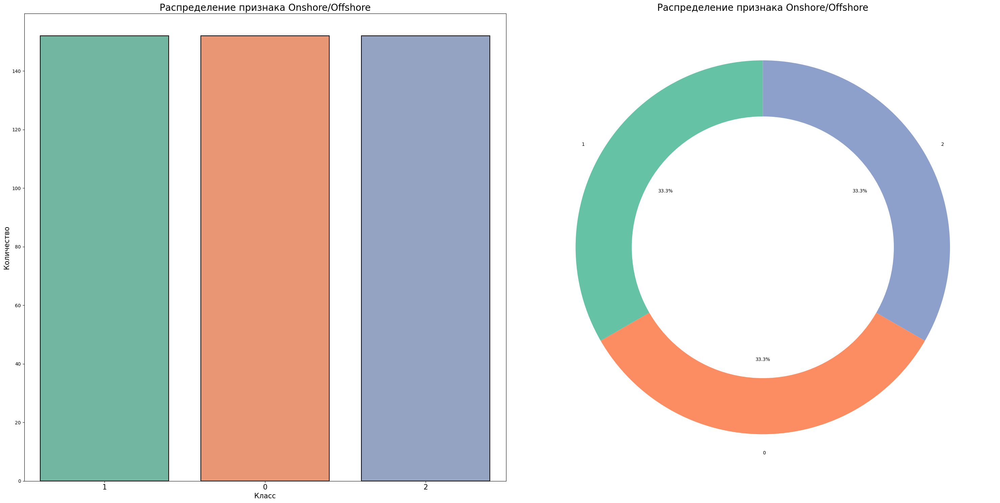

In [126]:
# Строим график распределения целевой переменной после SMOTE
target_distribution_plot(
    target = y_train_os['Onshore/Offshore'],
    title = 'Распределение целевой переменной после SMOTE'
)

#### $5.6$

Используем алгоритм `RandomForestClassifier` чтобы выделить 15 наиболее важных признаков для предсказания:

In [97]:
# Создаём объект класса RandomForestClassifier() и обучаем его
RF_Classifier = ensemble.RandomForestClassifier(random_state = 42)
RF_Classifier.fit(X_train_os, y_train_os.values.ravel())

# Получаем важность признаков
important_features = RF_Classifier.feature_importances_



# Создаем DataFrame с признаками и их важностью
important_features_data = pd.DataFrame({
    'Feature': X_train_os.columns,
    'Importance': important_features
})

# Сортируем по убыванию важности
print('При помощи объекта "RandomForestClassifier" были выбраны следующие признаки:\n\n{}'.format(important_features_data.sort_values(by = 'Importance', ascending = False)))

При помощи объекта "RandomForestClassifier" были выбраны следующие признаки:

                           Feature  Importance
3   Thickness (net pay average ft)    0.152432
1                            Depth    0.138000
2     Thickness (gross average ft)    0.109691
0                        Longitude    0.096153
23            Structural setting_4    0.090734
20               Tectonic regime_5    0.054250
4                         Porosity    0.052908
19               Tectonic regime_3    0.052235
10                    Field name_7    0.033441
6                    Region_EUROPE    0.030667
11                Reservoir unit_3    0.025409
24            Structural setting_5    0.022900
18               Tectonic regime_2    0.022572
17                    Basin name_2    0.018392
8      Reservoir status_DEVELOPING    0.014378
7             Region_NORTH AMERICA    0.012516
15                       Country_3    0.010954
22            Structural setting_2    0.010479
21              Operator comp

Фильтруем признаки в **DataFrame** и строим визуализацию:

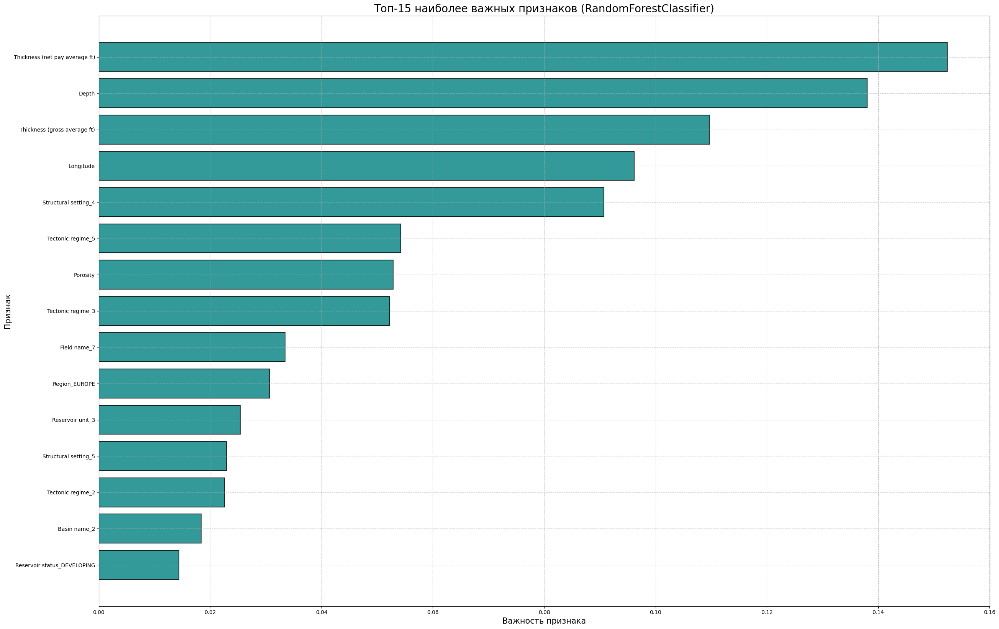

In [98]:
# Выбираем топ-15 признаков
top_features = important_features_data.nlargest(15, 'Importance')['Feature'].tolist()

# Фильтруем данные, оставляя только топ-15 признаков
X_train_os = X_train_os[top_features]
X_valid_processed = X_valid_processed[top_features]
X_test_processed = X_test_processed[top_features]



# Строим визуализацию
plt.figure(figsize = (30, 20))
        
plt.barh(
    important_features_data.sort_values(by = 'Importance', ascending = False).head(15)['Feature'],
    important_features_data.sort_values(by = 'Importance', ascending = False).head(15)['Importance'],
    color = 'teal',
    edgecolor = 'black',
    linewidth = 1.5,
    alpha = 0.8
)
        
plt.xlabel('Важность признака', fontsize = 15)
plt.ylabel('Признак', fontsize = 15)
plt.title('Топ-15 наиболее важных признаков (RandomForestClassifier)', fontsize = 20)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.gca().invert_yaxis()  
plt.show()

## <CENTER> **`6.` Machine Learning**

На данном этапе мы построим несколько подходящих моделей и выявим наилучшую.

Используем следующие метрики для оценки:

* **Accuracy**:________________(метрика точности),

* **Precision**:_______________(положительное прогнозное значение),

* **Recall**:__________________(доля истинно положительных результатов),

* **F1-score**:________________(среднее значение Точности измерений),

* **Classification report**:___(таблица рассчитанных метрик).

Создадим функцию для вычисления метрик:

In [99]:
# Создаём функцию 'print_metrics'       
def print_metrics(y_true, y_predict, model_name, decimal_places = 3):
    
    """
    Вычисляет и выводит метрики (Accuracy, Precision, Recall, F1-score, Classification report) для оценки модели.
    
    Параметры:
    - y_true: истинные значения (например, y_valid)
    - y_pred: предсказанные значения (например, y_log_predict)
    - model_name: строка с названием модели (например, "LogisticRegression")
    - decimal_places: количество знаков после запятой для форматирования (по умолчанию 3)
    
    """
    
    
    # Вычисляем метрики
    accuracy_metric = metrics.accuracy_score(y_true, y_predict)
    precision_metric = metrics.precision_score(y_true, y_predict, average = 'weighted')
    recall_metric = metrics.recall_score(y_true, y_predict, average = 'weighted')
    f1_metric = metrics.f1_score(y_true, y_predict, average = 'weighted')
    cr_metrics = metrics.classification_report(y_true, y_predict)
    
    
    # Выведем результат
    print(f'{model_name} (значения метрик):\n')
    print(f'Accuracy: {accuracy_metric:.{decimal_places}f}')
    print('-' * 80)
    print(f'Precision: {precision_metric:.{decimal_places}f}')
    print('-' * 80)
    print(f'Recall: {recall_metric:.{decimal_places}f}')
    print('-' * 80)
    print(f'F1-score: {f1_metric:.{decimal_places}f}')
    print('-' * 80)
    print()
    print(f'Classification report:\n\n{cr_metrics}')
    print('-' * 80)

#### $6.1$

#### **Логистическая регрессия (Logistic Regression)**

Для начала используем Логистическую регрессию, так как это простая и интерпретируемая модель, которая хорошо работает для бинарной классификации:

In [100]:
# Создаём объект класса LogisticRegression() и обучаем его
Log_model = linear_model.LogisticRegression()
Log_model.fit(X_train_os, y_train_os.values.ravel())


# Делаем предсказания на валидационной выборке
y_log_predict = Log_model.predict(X_valid_processed)

# Считаем метрики
print_metrics(y_valid, y_log_predict, 'LogisticRegression')

LogisticRegression (значения метрик):

Accuracy: 0.796
--------------------------------------------------------------------------------
Precision: 0.824
--------------------------------------------------------------------------------
Recall: 0.796
--------------------------------------------------------------------------------
F1-score: 0.806
--------------------------------------------------------------------------------

Classification report:

              precision    recall  f1-score   support

           0       0.62      0.77      0.69        26
           1       0.92      0.82      0.86        66
           2       0.00      0.00      0.00         1

    accuracy                           0.80        93
   macro avg       0.51      0.53      0.52        93
weighted avg       0.82      0.80      0.81        93

--------------------------------------------------------------------------------


Построим матрицу ошибок:

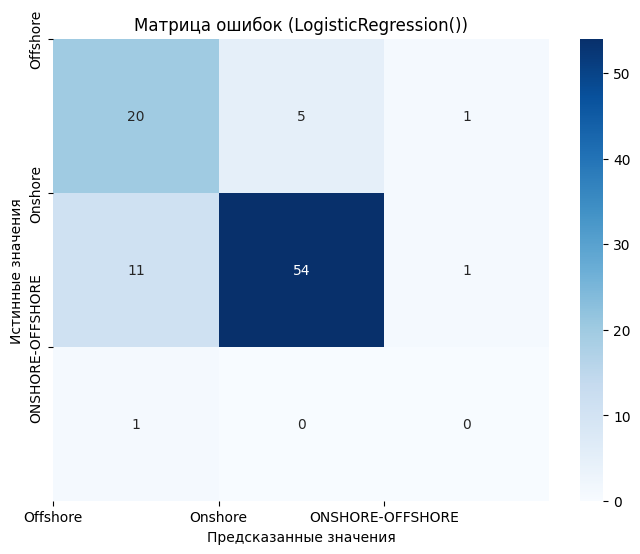

In [101]:
# Расчёт матрицы ошибок
cm = metrics.confusion_matrix(y_valid, y_log_predict)



# Задаём размер тепловой карты
plt.rcParams['figure.figsize'] = (8, 6)

# Построение тепловой карты
sns.heatmap(
    cm,
    annot = True,
    fmt = 'd',
    cmap = 'Blues'
)

# Задаём параметры карты
plt.title('Матрица ошибок (LogisticRegression())')
plt.xlabel('Предсказанные значения')
plt.ylabel('Истинные значения')
plt.xticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])
plt.yticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])

# Отображаем тепловую карту
plt.show()

**Вывод:**

Метрики в диапазоне $0.796$ – $0.824$ указывают на умеренно хорошую модель, но есть потенциал для улучшения.

#### $6.2$

#### **Деревья решений (Decision Tree)**

Используем модель дерева решений с количеством деревьев равным 5:

In [102]:
# Создаём объект класса DecisionTreeClassifier() и обучаем его
DT_classifier = tree.DecisionTreeClassifier(max_depth = 5)
DT_classifier.fit(X_train_os, y_train_os.values.ravel())


# Делаем предсказания на валидационной выборке
y_dt_predict = DT_classifier.predict(X_valid_processed)


# Рассчитываем метрики
print_metrics(y_valid, y_dt_predict, 'DecisionTreeClassifier')

DecisionTreeClassifier (значения метрик):

Accuracy: 0.796
--------------------------------------------------------------------------------
Precision: 0.797
--------------------------------------------------------------------------------
Recall: 0.796
--------------------------------------------------------------------------------
F1-score: 0.795
--------------------------------------------------------------------------------

Classification report:

              precision    recall  f1-score   support

           0       0.63      0.73      0.68        26
           1       0.87      0.83      0.85        66
           2       0.00      0.00      0.00         1

    accuracy                           0.80        93
   macro avg       0.50      0.52      0.51        93
weighted avg       0.80      0.80      0.79        93

--------------------------------------------------------------------------------


c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and

Диапазон значений метрик оказались чуть ниже, чем при обучении логистической регрессии, диапазон значений: $0.795$ - $0.797$. 

Организуем перебор гиперпараметров при помощи **GridSearchCV()**:

In [103]:
# Создаём объекта класса DecisionTreeClassifier()
DT_classifier = tree.DecisionTreeClassifier(random_state = 42)


# Определение параметров для поиска
param_grid = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}


# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = DT_classifier,
    param_grid = param_grid,
    cv = 3,
    verbose = 2,
    n_jobs = -1
)


# Обучаем модель 
grid_search.fit(X_train_os, y_train_os.values.ravel())

# Делаем предсказание для валидационной выборки
y_dt_predict = grid_search.predict(X_valid_processed)



# Рассчитываем метрики
print_metrics(y_valid, y_dt_predict, 'DecisionTreeClassifier')
print()

# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Fitting 3 folds for each of 144 candidates, totalling 432 fits
DecisionTreeClassifier (значения метрик):

Accuracy: 0.785
--------------------------------------------------------------------------------
Precision: 0.774
--------------------------------------------------------------------------------
Recall: 0.785
--------------------------------------------------------------------------------
F1-score: 0.779
--------------------------------------------------------------------------------

Classification report:

              precision    recall  f1-score   support

           0       0.64      0.62      0.63        26
           1       0.84      0.86      0.85        66
           2       0.00      0.00      0.00         1

    accuracy                           0.78        93
   macro avg       0.49      0.49      0.49        93
weighted avg       0.77      0.78      0.78        93

--------------------------------------------------------------------------------

Наилучшие значения 

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning:

invalid value encountered in cast

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppDa

**Вывод:**

По сравнению с предыдущей моделью (без перебора параметров при помощи **GridSearchCV**) данная показывает пока наихудшие результаты, диапазон метрик: $0.774$ - $0.785$.

Построим матрицу ошибок:

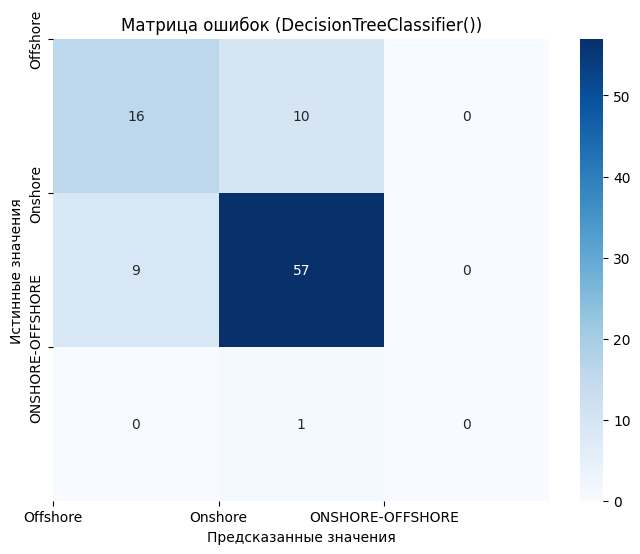

In [104]:
# Расчёт матрицы ошибок
cm = metrics.confusion_matrix(y_valid, y_dt_predict)



# Задаём размер тепловой карты
plt.rcParams['figure.figsize'] = (8, 6)

# Построение тепловой карты
sns.heatmap(
    cm,
    annot = True,
    fmt = 'd',
    cmap = 'Blues'
)

# Задаём параметры карты
plt.title('Матрица ошибок (DecisionTreeClassifier())')
plt.xlabel('Предсказанные значения')
plt.ylabel('Истинные значения')
plt.xticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])
plt.yticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])

# Отображаем тепловую карту
plt.show()

**Вывод:**

Из полученных рассчётов видно, что значения метрик значительно снизилось.

#### $6.3$

#### **Случайный лес (Random Forest)**

Построим модель случайного леса на тренировочной выборке. Зададим следующие гиперпараметры:

* `n_estimators` = 200;

* `max_depth` = 14;

* `criterion` = 'gini';

* `min_samples_split` = 20;

* `random_state` = 42.

In [105]:
# Создаем объект класса RandomForestClassifier()
RF_Classifier = ensemble.RandomForestClassifier(
    
    n_estimators = 200,
    max_depth = 14,
    criterion = 'gini',
    min_samples_split = 20,
    random_state = 42
    
)

# Обучаем модель на тренировочной выборке
RF_Classifier.fit(X_train_os, y_train_os.values.ravel())

# Делаем предсказания на валидационной выборке
y_rf_predict = RF_Classifier.predict(X_valid_processed)



# Рассчитываем метрики
print_metrics(y_valid, y_rf_predict, 'RandomForestClassifier')

RandomForestClassifier (значения метрик):

Accuracy: 0.839
--------------------------------------------------------------------------------
Precision: 0.839
--------------------------------------------------------------------------------
Recall: 0.839
--------------------------------------------------------------------------------
F1-score: 0.839
--------------------------------------------------------------------------------

Classification report:

              precision    recall  f1-score   support

           0       0.73      0.73      0.73        26
           1       0.89      0.89      0.89        66
           2       0.00      0.00      0.00         1

    accuracy                           0.84        93
   macro avg       0.54      0.54      0.54        93
weighted avg       0.84      0.84      0.84        93

--------------------------------------------------------------------------------


Значения всех метрик равны $0.839$, что является пока лучшим результатом. 

Организуем перебор при помощи **RandomizedSearchCV()**:

In [106]:
# Создаем объект класса RandomForestClassifier()
RF_Classifier = ensemble.RandomForestClassifier()


# Определение пространства поиска
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}


# Производим поиск
random_search = model_selection.RandomizedSearchCV(
    estimator = RF_Classifier,
    param_distributions = param_dist,
    n_iter = 100,
    cv = 3,
    verbose = 2,
    random_state = 42
)


# Обучаем модель 
random_search.fit(X_train_os, y_train_os.values.ravel())

# Делаем предсказание для валидационной выборки
y_rf_predict = random_search.predict(X_valid_processed)



# Рассчитываем метрики
print_metrics(y_valid, y_rf_predict, 'RandomForestClassifier')

# Сохраним полученные гиперпараметры в переменной
best_parameters = random_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END criterion=gini, max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END criterion=gini, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=500;

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and

Построим матрицу ошибок:

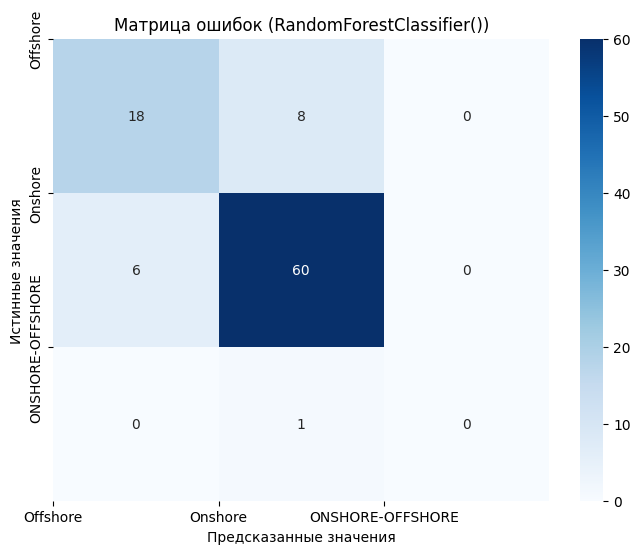

In [107]:
# Расчёт матрицы ошибок
cm = metrics.confusion_matrix(y_valid, y_rf_predict)



# Задаём размер тепловой карты
plt.rcParams['figure.figsize'] = (8, 6)

# Построение тепловой карты
sns.heatmap(
    cm,
    annot = True,
    fmt = 'd',
    cmap = 'Blues'
)

# Задаём параметры карты
plt.title('Матрица ошибок (RandomForestClassifier())')
plt.xlabel('Предсказанные значения')
plt.ylabel('Истинные значения')
plt.xticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])
plt.yticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])

# Отображаем тепловую карту
plt.show()

**Вывод:**

Данная модель показала заниженные значения метрик по сравнению с предыдущей моделью: $0.827$ - $0.839$.

#### $6.4$

#### **K-ближайших соседей (KNN)**

Сразу организуем перебор гиперпараметров при помощи **GridSearchCV()**:

In [108]:
# Создаём объекта класса KNeighborsClassifier()
KNN_Classifier = neighbors.KNeighborsClassifier()


# Определение параметров для поиска
param_grid = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski'],
    'p': [1, 2, 3]
}


# Производим поиск
grid_search = model_selection.GridSearchCV(
    estimator = KNN_Classifier,
    param_grid = param_grid,
    cv = 5,
    verbose = 2,
    n_jobs = -1
)


# Обучаем модель 
grid_search.fit(X_train_os, y_train_os.values.ravel())

# Делаем предсказание для валидационной выборки
y_knn_predict = grid_search.predict(X_valid_processed)

Fitting 5 folds for each of 192 candidates, totalling 960 fits


c:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\numpy\ma\core.py:2820: RuntimeWarning:

invalid value encountered in cast



Рассчитываем метрики:

In [109]:
print('KNeighborsClassifier. Полученные метрики:\n')


# 1. Accuracy
accuracy = metrics.accuracy_score(y_valid, y_knn_predict)
print(f"Accuracy: {accuracy:.3f}")
print('-' * 80) 



# 2. Precision (по классам и усредненный)
precision_macro = metrics.precision_score(y_valid, y_knn_predict, average = 'macro')
precision_micro = metrics.precision_score(y_valid, y_knn_predict, average = 'micro')
precision_weighted = metrics.precision_score(y_valid, y_knn_predict, average = 'weighted')

print(f"Precision Macro: {precision_macro:.3f}")
print('-' * 80) 
print(f"Precision Micro: {precision_micro:.3f}")
print('-' * 80) 
print(f"Precision Weighted: {precision_weighted:.3f}")
print('-' * 80) 



# 3. Recall (по классам и усредненный)
recall_macro = metrics.recall_score(y_valid, y_knn_predict, average = 'macro')
recall_micro = metrics.recall_score(y_valid, y_knn_predict, average = 'micro')
recall_weighted = metrics.recall_score(y_valid, y_knn_predict, average = 'weighted')

print(f"Recall Macro: {recall_macro:.3f}")
print('-' * 80) 
print(f"Recall Micro: {recall_micro:.3f}")
print('-' * 80) 
print(f"Recall Weighted: {recall_weighted:.3f}")
print('-' * 80) 



# 4. F1-score (по классам и усредненный)
f1_macro = metrics.f1_score(y_valid, y_knn_predict, average = 'macro') 
f1_micro = metrics.f1_score(y_valid, y_knn_predict, average = 'micro') 
f1_weighted = metrics.f1_score(y_valid, y_knn_predict, average = 'weighted') 

print(f"F1 Macro: {f1_macro:.3f}")
print('-' * 80) 
print(f"F1 Micro: {f1_micro:.3f}")
print('-' * 80) 
print(f"F1 Weighted: {f1_weighted:.3f}")
print('-' * 80) 

KNeighborsClassifier. Полученные метрики:

Accuracy: 0.806
--------------------------------------------------------------------------------
Precision Macro: 0.518
--------------------------------------------------------------------------------
Precision Micro: 0.806
--------------------------------------------------------------------------------
Precision Weighted: 0.816
--------------------------------------------------------------------------------
Recall Macro: 0.534
--------------------------------------------------------------------------------
Recall Micro: 0.806
--------------------------------------------------------------------------------
Recall Weighted: 0.806
--------------------------------------------------------------------------------
F1 Macro: 0.525
--------------------------------------------------------------------------------
F1 Micro: 0.806
--------------------------------------------------------------------------------
F1 Weighted: 0.810
--------------------------

**Вывод:**

Модель показывает приемлемую общую производительность (`Accuracy`: $0.806$, `F1 Weighted`: $0.810$), но страдает от низкой чувствительности к меньшинственным классам (`F1 Macro`: $0.525$).

Выведем наилучшие гиперпараметры:

In [110]:
# Сохраним полученные гиперпараметры в переменной
best_parameters = grid_search.best_params_

# Выведем наилучшие значения гиперпараметров
print(f'Наилучшие значения гиперпараметров: {best_parameters}')

Наилучшие значения гиперпараметров: {'metric': 'euclidean', 'n_neighbors': 9, 'p': 1, 'weights': 'distance'}


Построим матрицу ошибок:

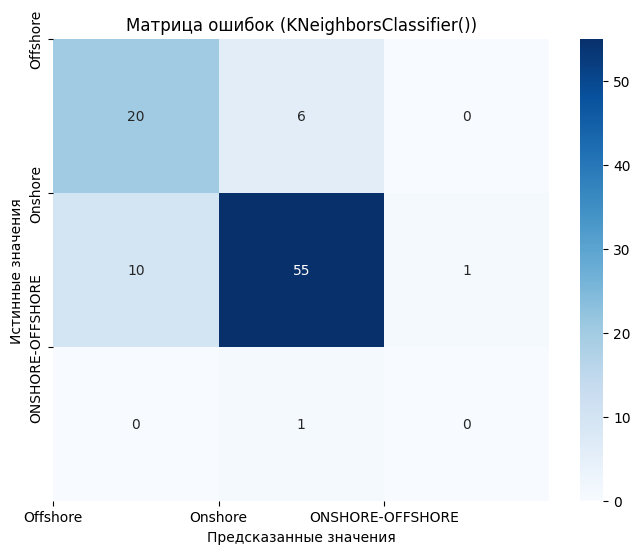

In [111]:
# Расчёт матрицы ошибок
cm = metrics.confusion_matrix(y_valid, y_knn_predict)



# Задаём размер тепловой карты
plt.rcParams['figure.figsize'] = (8, 6)

# Построение тепловой карты
sns.heatmap(
    cm,
    annot = True,
    fmt = 'd',
    cmap = 'Blues'
)

# Задаём параметры карты
plt.title('Матрица ошибок (KNeighborsClassifier())')
plt.xlabel('Предсказанные значения')
plt.ylabel('Истинные значения')
plt.xticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])
plt.yticks([0, 1, 2], ['Offshore', 'Onshore', 'ONSHORE-OFFSHORE'])

# Отображаем тепловую карту
plt.show()

#### $6.5$

Составим таблицу (*DataFrame*) со следующими столбцами:

Наименование модели:

* `'model_name'`,

Метрики и их значения:

* `'Accuracy_score'`,

* `'Precision_score'`,

* `'Recall_score'`,

* `'F1-score'`.

In [112]:
# Создаём DataFrame
model_metrics = {
    'LogisticRegression'       : {'Accuracy_score': 0.796, 'Precision_score': 0.824, 'Recall_score': 0.796, 'F1_score': 0.806},
    'DecisionTreeClassifier'   : {'Accuracy_score': 0.796, 'Precision_score': 0.797, 'Recall_score': 0.796, 'F1_score': 0.795},
    'RandomForestClassifier'   : {'Accuracy_score': 0.839, 'Precision_score': 0.839, 'Recall_score': 0.839, 'F1_score': 0.839},
    'KNeighborsClassifier'     : {'Accuracy_score': 0.806, 'Precision_score': 0.816, 'Recall_score': 0.806, 'F1_score': 0.810},
}

metrics_df = pd.DataFrame(model_metrics).T



# Выводим таблицу
display(metrics_df)

,Accuracy_score,Precision_score,Recall_score,F1_score
LogisticRegression,0.796,0.824,0.796,0.806
DecisionTreeClassifier,0.796,0.797,0.796,0.795
RandomForestClassifier,0.839,0.839,0.839,0.839
KNeighborsClassifier,0.806,0.816,0.806,0.810


Определим лучшую модель :

In [113]:
# Находим модели с максимальными значениями для каждой метрики
best_model_accuracy = metrics_df['Accuracy_score'].idxmax()
best_accuracy = metrics_df['Accuracy_score'].max()

best_model_precision = metrics_df['Precision_score'].idxmax()
best_precision = metrics_df['Precision_score'].max()

best_model_recall = metrics_df['Recall_score'].idxmax()
best_recall = metrics_df['Recall_score'].max()

best_model_f1 = metrics_df['F1_score'].idxmax()
best_f1 = metrics_df['F1_score'].max()



# Выводим результаты
print(f'Лучшая модель по метрике Accuracy: {best_model_accuracy} с точностью {best_accuracy:.3f}')
print('-' * 80)
print()
print(f'Лучшая модель по метрике Precision: {best_model_precision} с точностью {best_precision:.3f}')
print('-' * 80)
print()
print(f'Лучшая модель по метрике Recall: {best_model_recall} с точностью {best_recall:.3f}')
print('-' * 80)
print()
print(f'Лучшая модель по метрике F1: {best_model_f1} с F1-мерой {best_f1:.3f}')
print('-' * 80)

Лучшая модель по метрике Accuracy: RandomForestClassifier с точностью 0.839
--------------------------------------------------------------------------------

Лучшая модель по метрике Precision: RandomForestClassifier с точностью 0.839
--------------------------------------------------------------------------------

Лучшая модель по метрике Recall: RandomForestClassifier с точностью 0.839
--------------------------------------------------------------------------------

Лучшая модель по метрике F1: RandomForestClassifier с F1-мерой 0.839
--------------------------------------------------------------------------------


Среди обученных моделей, наилучшей оказалась модель `RandomForestClassifier`. Сохраним её:

In [119]:
# Загружаем или обучаем модель
try:
    best_model = joblib.load('Random_Forest_model.pkl')
    print(f'Модель загружена: {type(best_model)}.')
    
    
# Если модель не найдена, обучаем её
except:
    
    best_model = ensemble.RandomForestClassifier(
        n_estimators = 200,
        max_depth = 14,
        criterion = 'gini',
        min_samples_split = 20,
        random_state = 42
    )
    
    best_model.fit(X_train_os, y_train_os.values.ravel())
    joblib.dump(best_model, 'Random_Forest_model.pkl')
    print('Модель обучена и сохранена в "Random_Forest_model.pkl"')

Модель обучена и сохранена в "Random_Forest_model.pkl"


Сделаем предсказание тестовой выборки:

In [120]:
# Делаем предсказания
y_test_predict = best_model.predict(X_test_processed)

# Проверяем количество предсказаний
print(f'Количество предсказаний: {len(y_test_predict)}')

# Проверяем первые несколько предсказаний
print('Первые 5 предсказаний: {}'.format(y_test_predict[: 5]))

Количество предсказаний: 133
Первые 5 предсказаний: [1 0 0 0 1]


Создаём файл для сабмишена:

In [121]:
# Создаём DataFrame для сабмишена
if 'id' in X_test_processed.columns:
    submission_df = pd.DataFrame({
        'index': X_test_processed['id'],
        'Onshore/Offshore': y_test_predict
    })
    
else:
    submission_df = pd.DataFrame({
        'index': X_test_processed.index,
        'Onshore/Offshore': y_test_predict
    })
    
    
    
# Проверяем созданный DataFrame
print('Первые 5 строк файла submission.csv:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(submission_df.shape[0], submission_df.shape[1]))

# Выведем первые пять строк 
display(submission_df.head())



# Сохраняем в CSV
submission_df.to_csv('submission.csv', index = False)
print('Файл "submission.csv" сохранён.')

Первые 5 строк файла submission.csv:

Количество строк: 133;
Количество признаков (столбцов): 2.


,index,Onshore/Offshore
0,0,1
1,1,0
2,2,0
3,3,0
4,4,1


Файл "submission.csv" сохранён.


## <CENTER> **`7.` Вывод**

Таким образом, среди всех рассмотренных моделей, модель случайного леса **RandomForestClassifier** показала наилучший результат с точки зрения качества на валидационных фолдах, а также с точки зрения переобученности.